Nama:

In [1]:
print('Mugi Anandika')

Mugi Anandika


# Business Understanding

## Latar Belakang

Perkembangan teknologi dan big data pada era ini semakin maju. Hal ini memotivasi perusahaan market place yang bergerak pada bidang pelayanan pengiriman paket untuk membuat suatu sistem prediksi yang bertujuan untuk meningkatkan pelayanan customer.

## Business Objectives

Meningkatkan kepuasan pelanggan sehingga pelanggan memberikan rating 5 untuk jasa pengiriman paket. 
Beberapa upaya yang dapat dilakukan untuk mencapai target tersebut dalam konteks bisnis adalah:
- Mempercepat jarak antara waktu barang approved hingga barang sampai.
- Mempermurah harga pengiriman barang (payment_value).
- Seller dan Customer berada di kota/daerah yang sama/dekat.

## Model Objectives

Membuat model klasifikasi untuk menentukan apakah pelanggan memberikan rating 5 (label 1) atau rating di bawah 5 (label 0)

## Model Success Criteria

Model yang memiliki: Recall > 0.6; Precision > 0.6; FPR < 0.45

## Business Success Criteria

lebih dari 55% Pelanggan memberikan rating 5 terhadap jasa pelayanan pengiriman

# Data

## Data Description

- customer_id : Merupakan suatu identitas dari customer.
- customer_unique_id : Suatu pengidentifikasi customer dari customer lain, id ini bersifat unik atau berbeda dengan customer lain.
- customer_zip_code_prefix : Suatu 5 digit angka pertama dari kode lokasi customer (zip code)
- customer_city : Nama kota dari pelanggan/pembeli (customer)
- customer_state : inisial lokasi daerah bagian si pelanggan
- geolocation_zip_code_prefix: suatu kode pos (zip code) yang terdiri dari 5 angka digit pertama dari geo lokasi
- geolocation_lat : Merupakan suatu garis lintang (latitude) pada lokasi saat ini. 
- geolocation_lng: Merupakan suatu garis bujur (longitude) pada lokasi saat ini. 
- geolocation_city: Namas kota dari lokasi saat ini. 
- geolocation_state: inisial lokasi daerah bagian saat ini.
- order_id : suatu identitas dari order yang bersifat unik.
- order_item_id : Suatu nomor yang berurutan sebagai identitas dari item, fitur tidak bersifat unik.
- product_id : Suatu identitas produk yang bersifat unik (tidak ada yang sama antar satu row dengan row lainnya).
- seller_id : Suatu identitas seller (penjual) yang bersifat unik.
- shipping_limit_date : Merupakan suatu batas waktu penjual melakukan pengiriman ke mitra logistik.
- price : Harga dari suatu item.
- freight_value : Suatu tarif pengiriman dimana kargo tertentu dikirim dari suatu titik ke titik lain.
- payment_sequential : Jika pelanggan melakukan lebih dari satu metode pembayaran, maka urutan pembayaran tersebut akan dibuat dan ditampilkan pada fitur ini.
- payment_type : Suatu metode pembayaran yang dipilih oleh pelanggan.
- payment_installments : Banyaknya jumlah angsuran yang dipilih oleh pelanggan.
- payment_value : Besarnya nilai transaksi yang dilakukan.
- order_status : Suatu status pesanan (delivered, shipped, lainnya).
- order_purchase_timestamp : Tanggal/waktu pembelian terjadi.
- order_approved_at : Tanggal/waktu pembayaran disetujui.
- order_delivered_carrier_date : Tanggal/waktu jika barang telah ditangani ke mitra logistik. 
- order_delivered_customer_date : Tanggal/waktu pengiriman pemesanan yang aktual kepada pelanggan.
- order_estimated_delivery_date : Estimasi taanggal/walut pengiriman yang diinformasikan ke pelanggan pata saat pembelian.
- product_category_name : Merupakan kategori produk yang mana kategori tersebut dalam bahasa portugal.
- product_name_lenght : Jumlah panjang karakter dari nama produk.
- product_description_lenght: Jumlah panjang karakter dari deskripsi produk.
- product_photos_qty : Jumlah foto pada produk yang digunakan (dipublish)
- product_weight_g : Berat produk/barang dalam satuan gram.
- product_length_cm : Panjang produk/barang dalam satuan centimeters.
- product_height_cm : Tinggi produk/barang dalam satuan centimeters.
- product_width_cm : Lebar produk/barang dalam satuan centimeters.
- seller_zip_code_prefix : 5 digit angka kode pos (zip code) pertama dari penjual
- seller_city : nama kota si penjual.
- seller_state : inisial lokasi daerah bagian si penjual.
- product_category_name_english : Merupakan kategori produk yang mana kategori tersebut dalam bahasa Inggris.
- label : merupakan penilaian dari customer,  1 = customer memberikan rating 5, 0 = customer memberikan rating dibawah 5

### Import Library

In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler, OneHotEncoder, PolynomialFeatures
from sklearn.feature_selection import mutual_info_classif, SelectKBest, VarianceThreshold, mutual_info_regression
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.metrics import classification_report, confusion_matrix, recall_score, precision_score, precision_recall_curve, roc_auc_score, roc_curve, r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, silhouette_score
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
import time
import random
from xgboost import XGBClassifier
from scipy.stats import skew, skewtest, pearsonr, spearmanr, normaltest, norm, t, ttest_ind

import warnings

warnings.filterwarnings('ignore')
def classif_lr(x, y, estimator, th):
    y_pred = estimator.predict_proba(x)[:,1] > th
    print(classification_report(y, y_pred, labels = [1,0]))
    
def classif(x, y, estimator):
    y_pred = estimator.predict(x)
    print(classification_report(y, y_pred, labels = [1,0]))

## Exploratory Data Analysis (EDA)

### General EDA

In [3]:
md = pd.read_csv('model_development_set.csv')

In [4]:
md.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,label
0,8b9f55ee19f0356ba6b3f03485e6922d,bc7b9e0d078c0c01f622b38cfcd7ee9c,20521.0,rio de janeiro,RJ,20521.0,-22.927008,-43.230270,rio de janeiro,RJ,276e586682c7afb8f69a92fb276dc884,delivered,2017-03-20 21:55:02,2017-03-20 21:55:02,2017-03-23 12:22:48,2017-03-30 13:57:07,2017-04-12 00:00:00,1.0,29b85c2f1ec5f4d02b03737a8fd3698b,44073f8b7e41514de3b7815dd0237f4f,2017-03-26 21:55:02,183.00,16.58,1.0,credit_card,4.0,199.58,moveis_decoracao,23.0,922.0,1.0,850.0,16.0,19.0,15.0,71070.0,brasilia,DF,furniture_decor,0
1,5dddbfbf5ba7c90dcb52c18d7835b756,2004ba7732339d9be65f2236d8887ae4,22450.0,rio de janeiro,RJ,22450.0,-22.987642,-43.228795,rio de janeiro,RJ,bf25ff262495b0b876bc4f594f736ecf,delivered,2018-05-10 11:23:03,2018-05-10 11:51:37,2018-05-16 15:29:00,2018-05-22 19:03:49,2018-06-14 00:00:00,1.0,53b36df67ebb7c41585e8d54d6772e08,7d13fca15225358621be4086e1eb0964,2018-05-16 11:51:37,115.00,0.00,1.0,credit_card,10.0,115.00,relogios_presentes,33.0,523.0,3.0,584.0,16.0,11.0,13.0,14050.0,ribeirao preto,SP,watches_gifts,1
2,c7f26440b498a90f758f26eda34f1801,e64711458e5538f51bc01c3388443450,20040.0,rio de janeiro,RJ,20040.0,-22.903826,-43.177436,rio de janeiro,RJ,b686713e41eabb681b6e7948118f24f7,delivered,2018-03-19 12:14:50,2018-03-19 12:30:39,2018-03-20 17:58:50,2018-04-02 22:36:51,2018-04-19 00:00:00,1.0,ee406bf28024d97771c4b1e8b7e8e219,7a67c85e85bb2ce8582c35f2203ad736,2018-03-23 12:30:39,144.99,17.28,1.0,credit_card,3.0,162.27,cool_stuff,54.0,629.0,1.0,1050.0,36.0,24.0,22.0,3426.0,sao paulo,SP,cool_stuff,1
3,05e86ce92eb1b627c2296627078d237c,480ca1a9f688a4c482177efdeeb5c3a3,21330.0,rio de janeiro,RJ,21330.0,-22.881837,-43.358881,rio de janeiro,RJ,d17ebef6117650c283479ff4dca49c6f,delivered,2017-07-20 12:00:22,2017-07-20 12:10:08,2017-07-24 16:24:55,2017-07-31 19:03:53,2017-08-21 00:00:00,1.0,b71ed32edb9ce4684e10a11309011b60,5a93f3ab0ef4c84ed5e1b5dbf23978bc,2017-08-03 12:10:08,10.00,15.10,1.0,credit_card,5.0,50.20,alimentos_bebidas,30.0,690.0,2.0,500.0,25.0,9.0,18.0,12250.0,monteiro lobato,SP,food_drink,1
4,552215a43eb8963b5ea631bde3e63bc5,dbc6ce0dfea576d88ea65af28d09b69e,56460.0,petrolandia,PE,56460.0,-8.982786,-38.222378,petrolandia,PE,08451f484ac3dba5140399d0b7e0a829,delivered,2018-01-02 10:32:22,2018-01-03 04:33:26,2018-01-08 19:42:58,2018-01-22 22:19:07,2018-02-14 00:00:00,1.0,df3a82b424a1bb351c314547f6644066,4e922959ae960d389249c378d1c939f5,2018-01-12 04:33:26,65.00,25.73,1.0,boleto,1.0,90.73,cool_stuff,35.0,534.0,2.0,200.0,20.0,10.0,20.0,12327.0,jacarei,SP,cool_stuff,1


In [5]:
md.describe()

,customer_zip_code_prefix,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_zip_code_prefix,label
count,13645.000000,13645.000000,13645.000000,13645.000000,13645.000000,13645.000000,13645.000000,13644.000000,13644.000000,13644.000000,13453.000000,13453.000000,13453.000000,13640.000000,13640.000000,13640.000000,13640.000000,13645.000000,13645.000000
mean,32591.244632,32591.244632,-21.980551,-45.957749,1.205497,120.053716,19.637410,1.094840,2.908385,171.660822,48.650338,769.392329,2.186575,2118.841789,30.429545,16.728959,23.144941,25186.739758,0.582558
std,26926.915187,26926.915187,4.261715,3.547860,0.711848,183.246923,15.345108,0.658019,2.726770,250.935781,10.042184,636.565672,1.714097,3773.584894,16.406090,13.608740,11.739437,28124.998800,0.493155
min,1009.000000,1009.000000,-33.690729,-67.884719,1.000000,1.200000,0.000000,1.000000,1.000000,0.010000,5.000000,4.000000,1.000000,2.000000,7.000000,2.000000,6.000000,1001.000000,0.000000
25%,13087.000000,13087.000000,-23.581554,-47.532049,1.000000,39.900000,13.490000,1.000000,1.000000,61.312500,42.000000,340.000000,1.000000,300.000000,18.000000,8.000000,15.000000,7013.000000,0.000000
50%,23560.000000,23560.000000,-22.909804,-46.472190,1.000000,75.000000,16.210000,1.000000,1.000000,108.910000,51.000000,594.000000,1.000000,700.000000,25.000000,13.000000,20.000000,13920.000000,1.000000
75%,38400.000000,38400.000000,-20.438593,-43.356660,1.000000,134.000000,20.430000,1.000000,4.000000,188.520000,57.000000,959.000000,3.000000,1813.000000,38.000000,20.000000,30.000000,30710.000000,1.000000
max,99970.000000,99970.000000,2.816613,-34.823932,15.000000,4799.000000,375.280000,19.000000,24.000000,7274.880000,66.000000,3988.000000,18.000000,40425.000000,105.000000,105.000000,105.000000,99730.000000,1.000000


In [6]:
md.nunique()

customer_id                      11594
customer_unique_id               11465
customer_zip_code_prefix          4063
customer_city                     1167
customer_state                      27
geolocation_zip_code_prefix       4063
geolocation_lat                  12950
geolocation_lng                  12948
geolocation_city                  1352
geolocation_state                   27
order_id                         11594
order_status                         1
order_purchase_timestamp         11584
order_approved_at                11461
order_delivered_carrier_date     11239
order_delivered_customer_date    11582
order_estimated_delivery_date      416
order_item_id                       14
product_id                        7475
seller_id                         1730
shipping_limit_date              11529
price                             2179
freight_value                     2896
payment_sequential                  17
payment_type                         4
payment_installments     

In [7]:
#Describe untuk fitur kategori
md.describe(include='object')

,customer_id,customer_unique_id,customer_city,customer_state,geolocation_city,geolocation_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,product_id,seller_id,shipping_limit_date,payment_type,product_category_name,seller_city,seller_state,product_category_name_english
count,13645,13645,13645,13645,13645,13645,13645,13645,13645,13642,13645,13645,13645,13645,13645,13645,13644,13453,13645,13645,13451
unique,11594,11465,1167,27,1352,27,11594,1,11584,11461,11239,11582,416,7475,1730,11529,4,70,415,20,68
top,50920f8cd0681fd86ebe93670c8fe52e,41a3b256cc497dc952a815b848345cbc,rio de janeiro,SP,rio de janeiro,SP,1c11d0f4353b31ac3417fbfa5f0f2a8a,delivered,2018-01-27 11:28:32,2018-01-29 11:35:23,2018-01-29 21:52:41,2018-02-16 16:26:53,2017-12-15 00:00:00,aca2eb7d00ea1a7b8ebd4e68314663af,4a3ca9315b744ce9f8e9374361493884,2018-02-02 11:31:03,credit_card,cama_mesa_banho,sao paulo,SP,bed_bath_table
freq,12,12,1716,5118,1715,5118,12,13645,12,12,12,12,92,85,264,12,10095,1455,3293,9586,1455


In [8]:
feature_identitas_status=['customer_id','customer_unique_id','order_id','product_id','seller_id','customer_zip_code_prefix','customer_city','geolocation_city','seller_city','geolocation_zip_code_prefix','seller_zip_code_prefix','order_status']
md=md.drop(feature_identitas_status, axis=1)

In [9]:
md.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13645 entries, 0 to 13644
Data columns (total 28 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_state                 13645 non-null  object 
 1   geolocation_lat                13645 non-null  float64
 2   geolocation_lng                13645 non-null  float64
 3   geolocation_state              13645 non-null  object 
 4   order_purchase_timestamp       13645 non-null  object 
 5   order_approved_at              13642 non-null  object 
 6   order_delivered_carrier_date   13645 non-null  object 
 7   order_delivered_customer_date  13645 non-null  object 
 8   order_estimated_delivery_date  13645 non-null  object 
 9   order_item_id                  13645 non-null  float64
 10  shipping_limit_date            13645 non-null  object 
 11  price                          13645 non-null  float64
 12  freight_value                  13645 non-null 

In [10]:
md.isnull().sum()/len(md)

customer_state                   0.000000
geolocation_lat                  0.000000
geolocation_lng                  0.000000
geolocation_state                0.000000
order_purchase_timestamp         0.000000
order_approved_at                0.000220
order_delivered_carrier_date     0.000000
order_delivered_customer_date    0.000000
order_estimated_delivery_date    0.000000
order_item_id                    0.000000
shipping_limit_date              0.000000
price                            0.000000
freight_value                    0.000000
payment_sequential               0.000073
payment_type                     0.000073
payment_installments             0.000073
payment_value                    0.000073
product_category_name            0.014071
product_name_lenght              0.014071
product_description_lenght       0.014071
product_photos_qty               0.014071
product_weight_g                 0.000366
product_length_cm                0.000366
product_height_cm                0

### Analisis Univariat

In [11]:
#Pseudo numerik
pseudo_num = ['order_item_id', 'payment_sequential', 'payment_installments','product_photos_qty']
number = list(md.select_dtypes('number').columns)
for x in pseudo_num:
    number.remove(x)

In [12]:
#datetimer
data_date=['order_purchase_timestamp','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date','shipping_limit_date']
cat = list(md.select_dtypes('object').columns)
for x in data_date:
    cat.remove(x)

In [13]:
#Filter numerik dan categorial data utuh
md_num=md[number]
md_pseudo_num=md[pseudo_num]
md_cat=md[cat]
md_data_date=md[data_date]

In [14]:
md_cat_all=pd.concat([md_cat, md_pseudo_num],axis=1)

#### Numeric

1
geolocation_lat


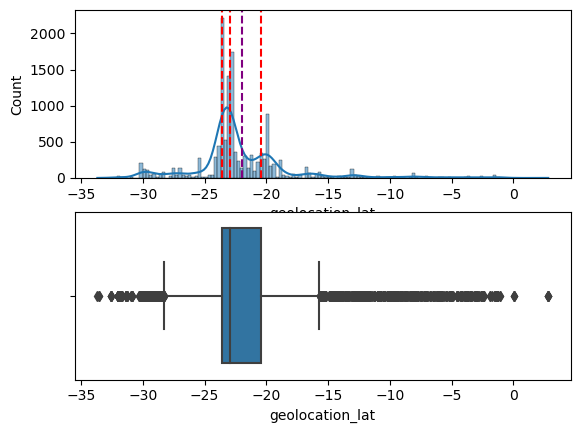

DATA SKEWED ,dengan nilai skew: 1.7744047968235386
count    13645.000000
mean       -21.980551
std          4.261715
min        -33.690729
25%        -23.581554
50%        -22.909804
75%        -20.438593
max          2.816613
Name: geolocation_lat, dtype: float64
iqr : 3.14296073721178
lower whisker: -28.293151402205805
upper whisker: -15.74009395475793
outlier: [-8.982786451748725, -8.183975780074155, -14.247193108742282, -10.934456694725904, -30.042202499999995, -32.05165364422402, -1.2941965718163198, -6.084360495285523, -14.23520702148562, -28.39381391018308, -13.006447198164942, -2.573244675308688, -15.5823819169291, -15.588089790130295, -7.098442938201267, -13.004049520399334, -28.37718387568899, -13.085604481921203, -12.077867684428751, -30.03386842964012, -29.67333648447753, -29.488635134923005, -29.162494308842305, -8.615280733073755, -5.090776844294895, -30.14296083790186, -29.994984923105864, -29.71737704887283, -29.33195174413561, -29.65906814296313, -8.119538392723213, -1

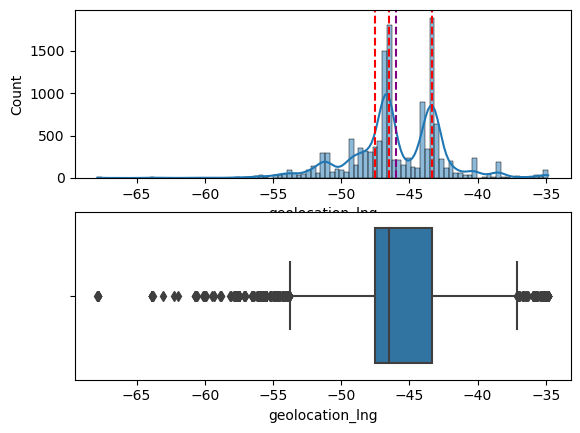

DATA SKEWED ,dengan nilai skew: -0.3500697442489406
count    13645.000000
mean       -45.957749
std          3.547860
min        -67.884719
25%        -47.532049
50%        -46.472190
75%        -43.356660
max        -34.823932
Name: geolocation_lng, dtype: float64
iqr : 4.175389225161517
lower whisker: -53.78050891145901
upper whisker: -37.09752376430288
outlier: [-34.92032997579382, -37.06358089829695, -53.92420333364961, -56.05731629438723, -56.09356509014755, -34.83580362839634, -53.92394093671219, -55.907848381096144, -54.6937042783334, -35.29031889341569, -55.72553971540075, -36.6804706378582, -35.16913763904442, -54.66391971021785, -53.81858413988113, -37.06034490423461, -34.89833932070516, -35.24258383542035, -34.91168845268046, -63.89801770038158, -34.83448789754842, -53.84801065762953, -37.04955726908646, -34.92540587870053, -57.0880122175509, -35.24033415167612, -53.89150848665444, -57.493209786067055, -35.73219517208147, -35.70528427814836, -55.23392116976711, -54.874039467

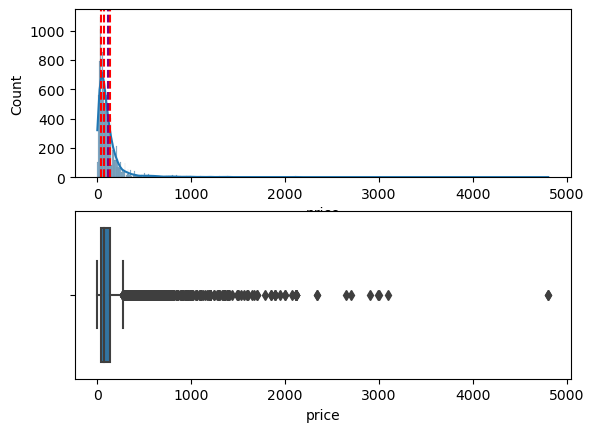

DATA SKEWED ,dengan nilai skew: 7.935146192564905
count    13645.000000
mean       120.053716
std        183.246923
min          1.200000
25%         39.900000
50%         75.000000
75%        134.000000
max       4799.000000
Name: price, dtype: float64
iqr : 94.1
lower whisker: 1.2
upper whisker: 275.0
outlier: [600.0, 279.99, 349.0, 279.0, 314.97, 299.99, 899.0, 325.0, 659.99, 329.9, 335.0, 498.0, 329.0, 539.0, 599.0, 535.0, 750.0, 667.0, 290.0, 329.9, 295.0, 319.0, 329.99, 285.0, 620.1, 1011.86, 335.0, 289.0, 759.9, 289.0, 335.9, 2649.0, 290.0, 467.0, 349.9, 504.0, 325.49, 385.0, 2110.0, 599.0, 519.99, 539.0, 969.0, 429.9, 339.0, 300.0, 460.0, 362.45, 349.9, 329.0, 288.0, 289.9, 299.0, 399.9, 329.9, 309.99, 539.0, 284.99, 649.9, 399.0, 299.0, 297.0, 419.9, 650.0, 659.99, 419.9, 528.0, 699.9, 279.9, 283.2, 284.99, 350.0, 489.99, 499.9, 2700.0, 458.0, 890.0, 299.9, 412.0, 522.5, 690.0, 510.0, 579.8, 314.99, 499.0, 359.0, 989.1, 1330.0, 1350.0, 2110.0, 341.65, 610.0, 2899.0, 326.16, 46

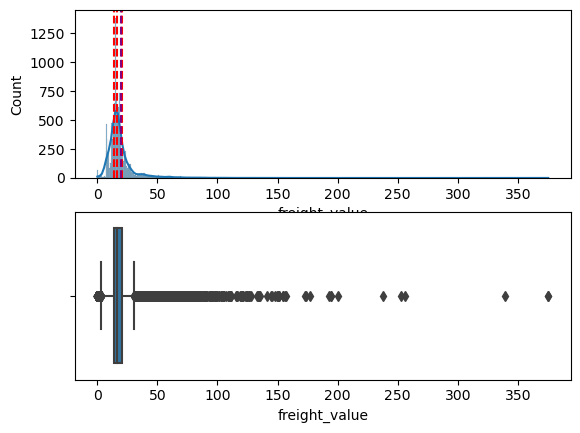

DATA SKEWED ,dengan nilai skew: 6.582456771858829
count    13645.000000
mean        19.637410
std         15.345108
min          0.000000
25%         13.490000
50%         16.210000
75%         20.430000
max        375.280000
Name: freight_value, dtype: float64
iqr : 6.9399999999999995
lower whisker: 3.09
upper whisker: 30.84
outlier: [0.0, 34.46, 256.13, 39.79, 66.63, 40.38, 48.99, 47.43, 50.34, 88.37, 45.44, 31.23, 58.88, 34.04, 35.99, 53.79, 37.37, 67.49, 38.52, 41.58, 84.15, 41.15, 38.53, 64.25, 34.44, 31.96, 60.74, 40.44, 31.79, 43.33, 0.0, 40.34, 90.98, 38.18, 33.09, 37.64, 35.05, 37.38, 36.78, 49.09, 2.7, 31.63, 51.74, 46.48, 52.12, 98.53, 45.09, 34.15, 86.34, 33.33, 32.29, 37.97, 41.33, 34.94, 66.21, 57.08, 33.08, 45.86, 103.22, 0.0, 73.41, 0.0, 37.3, 35.86, 35.67, 35.97, 71.92, 37.44, 45.25, 37.3, 89.36, 41.02, 33.39, 77.8, 141.36, 35.82, 31.0, 69.33, 57.08, 35.38, 45.12, 2.87, 58.78, 69.94, 65.54, 71.92, 34.57, 35.53, 53.83, 39.4, 59.98, 36.6, 39.53, 39.42, 82.07, 34.54, 37.3

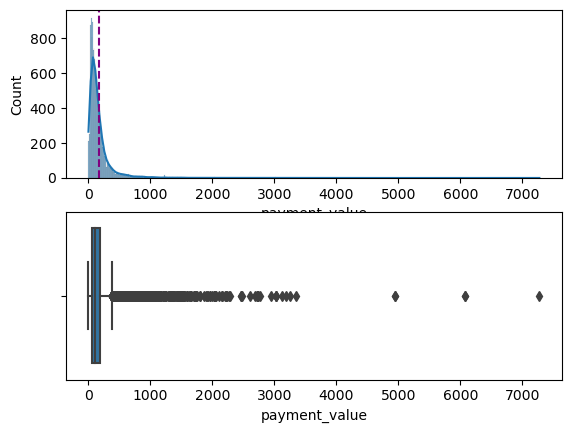

DATA TIDAK SKEWED
count    13644.000000
mean       171.660822
std        250.935781
min          0.010000
25%         61.312500
50%        108.910000
75%        188.520000
max       7274.880000
Name: payment_value, dtype: float64
iqr : 127.20750000000001
lower whisker: 0.01
upper whisker: 378.4
outlier: [856.13, 558.68, 1440.1, 921.05, 676.74, 527.57, 560.65, 1989.75, 503.71, 383.3, 489.24, 465.48, 575.44, 778.05, 687.43, 573.56, 420.88, 580.41, 421.12, 641.18, 464.95, 1036.83, 1006.44, 779.98, 1225.65, 1014.02, 620.68, 2681.29, 1032.35, 484.02, 523.72, 870.35, 413.77, 2213.22, 672.41, 539.88, 610.92, 387.64, 392.86, 990.54, 450.19, 1351.44, 540.06, 385.86, 491.26, 574.26, 870.35, 386.93, 643.16, 465.42, 469.84, 610.92, 3018.6, 410.1, 673.42, 577.54, 416.54, 414.4, 475.2, 940.78, 714.91, 721.74, 888.84, 468.0, 421.47, 430.09, 543.83, 712.05, 404.04, 470.38, 769.08, 3018.6, 413.84, 412.2, 574.51, 526.78, 445.6, 2734.66, 471.33, 838.97, 381.69, 487.38, 425.46, 1066.86, 435.72, 455.96, 54

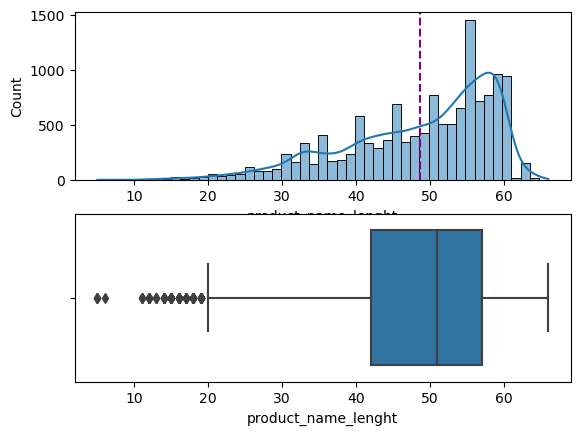

DATA TIDAK SKEWED
count    13453.000000
mean        48.650338
std         10.042184
min          5.000000
25%         42.000000
50%         51.000000
75%         57.000000
max         66.000000
Name: product_name_lenght, dtype: float64
iqr : 15.0
lower whisker: 20.0
upper whisker: 66.0
outlier: [15.0, 12.0, 19.0, 19.0, 19.0, 12.0, 14.0, 5.0, 18.0, 14.0, 17.0, 19.0, 19.0, 18.0, 15.0, 19.0, 19.0, 19.0, 14.0, 12.0, 15.0, 18.0, 14.0, 18.0, 16.0, 12.0, 16.0, 17.0, 18.0, 15.0, 14.0, 5.0, 16.0, 18.0, 16.0, 16.0, 19.0, 13.0, 19.0, 15.0, 18.0, 19.0, 19.0, 19.0, 18.0, 17.0, 12.0, 15.0, 19.0, 15.0, 19.0, 17.0, 16.0, 16.0, 18.0, 16.0, 18.0, 18.0, 17.0, 18.0, 19.0, 11.0, 15.0, 15.0, 15.0, 12.0, 12.0, 17.0, 16.0, 5.0, 15.0, 19.0, 19.0, 18.0, 18.0, 17.0, 16.0, 19.0, 13.0, 17.0, 13.0, 19.0, 15.0, 11.0, 12.0, 19.0, 11.0, 16.0, 19.0, 18.0, 14.0, 15.0, 16.0, 15.0, 15.0, 18.0, 15.0, 14.0, 17.0, 19.0, 16.0, 17.0, 6.0, 15.0, 18.0, 16.0, 19.0]
outlier counts: 107
*********************************************

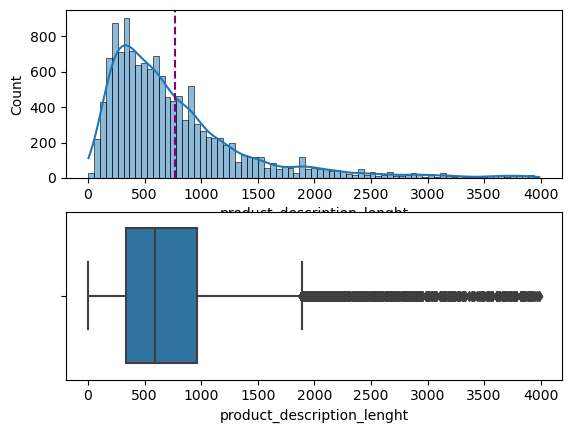

DATA TIDAK SKEWED
count    13453.000000
mean       769.392329
std        636.565672
min          4.000000
25%        340.000000
50%        594.000000
75%        959.000000
max       3988.000000
Name: product_description_lenght, dtype: float64
iqr : 619.0
lower whisker: 4.0
upper whisker: 1887.0
outlier: [1892.0, 3723.0, 1893.0, 2556.0, 1976.0, 1994.0, 2795.0, 1893.0, 3675.0, 2022.0, 2148.0, 3616.0, 2644.0, 2526.0, 2009.0, 2214.0, 1941.0, 2130.0, 2951.0, 3751.0, 3231.0, 3694.0, 3077.0, 2162.0, 2584.0, 1912.0, 2125.0, 1914.0, 3728.0, 2715.0, 3930.0, 2124.0, 1976.0, 2876.0, 1953.0, 1893.0, 2214.0, 2017.0, 1959.0, 2819.0, 2676.0, 3207.0, 1917.0, 2020.0, 1979.0, 2911.0, 3189.0, 3329.0, 3866.0, 2088.0, 2026.0, 1893.0, 2667.0, 1893.0, 2582.0, 2112.0, 1972.0, 2018.0, 2416.0, 2066.0, 3314.0, 2083.0, 2936.0, 2304.0, 2667.0, 2654.0, 2168.0, 1974.0, 1893.0, 1893.0, 2526.0, 3060.0, 2887.0, 3571.0, 3703.0, 2432.0, 2164.0, 2400.0, 1953.0, 2596.0, 2245.0, 1912.0, 3006.0, 2641.0, 3161.0, 2010.0, 3109.0

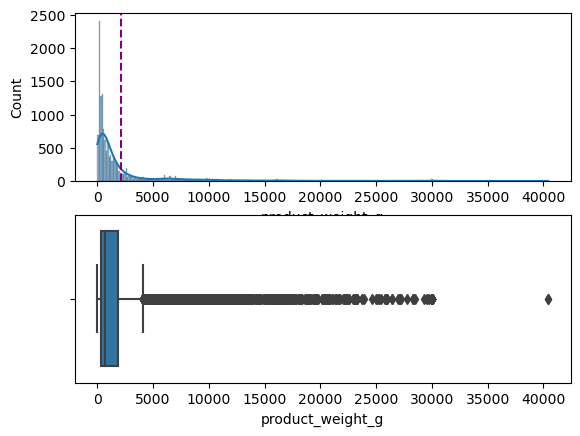

DATA TIDAK SKEWED
count    13640.000000
mean      2118.841789
std       3773.584894
min          2.000000
25%        300.000000
50%        700.000000
75%       1813.000000
max      40425.000000
Name: product_weight_g, dtype: float64
iqr : 1513.0
lower whisker: 2.0
upper whisker: 4075.0
outlier: [5650.0, 5000.0, 29700.0, 9000.0, 16650.0, 6550.0, 6950.0, 8250.0, 12250.0, 12250.0, 9350.0, 5650.0, 5950.0, 6400.0, 7000.0, 15100.0, 5000.0, 9700.0, 5350.0, 7000.0, 5850.0, 5650.0, 6800.0, 4100.0, 8950.0, 25250.0, 6700.0, 13300.0, 10750.0, 16250.0, 5400.0, 9400.0, 9650.0, 18650.0, 7000.0, 8200.0, 5700.0, 22100.0, 9225.0, 9625.0, 9750.0, 5417.0, 4105.0, 8450.0, 5550.0, 4338.0, 10300.0, 5950.0, 7350.0, 12250.0, 9200.0, 8500.0, 13800.0, 13600.0, 9750.0, 4100.0, 9300.0, 8700.0, 9750.0, 4800.0, 4750.0, 10250.0, 10150.0, 9750.0, 16100.0, 4338.0, 20600.0, 5950.0, 10600.0, 4100.0, 22350.0, 19800.0, 10075.0, 7050.0, 4800.0, 7200.0, 8875.0, 7225.0, 16650.0, 8683.0, 9000.0, 8000.0, 6900.0, 4850.0, 15833.0

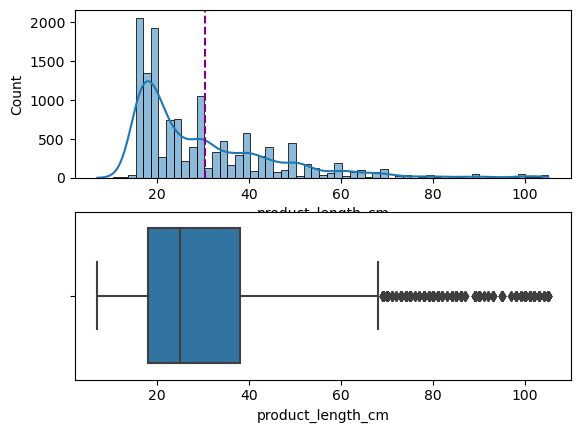

DATA TIDAK SKEWED
count    13640.000000
mean        30.429545
std         16.406090
min          7.000000
25%         18.000000
50%         25.000000
75%         38.000000
max        105.000000
Name: product_length_cm, dtype: float64
iqr : 20.0
lower whisker: 7.0
upper whisker: 68.0
outlier: [105.0, 105.0, 80.0, 75.0, 86.0, 100.0, 70.0, 105.0, 89.0, 78.0, 101.0, 69.0, 86.0, 69.0, 80.0, 70.0, 70.0, 71.0, 74.0, 95.0, 105.0, 80.0, 102.0, 98.0, 90.0, 75.0, 95.0, 81.0, 89.0, 69.0, 80.0, 105.0, 103.0, 69.0, 98.0, 70.0, 105.0, 90.0, 70.0, 80.0, 86.0, 69.0, 90.0, 70.0, 80.0, 105.0, 103.0, 70.0, 78.0, 69.0, 92.0, 95.0, 69.0, 80.0, 86.0, 69.0, 70.0, 101.0, 90.0, 99.0, 75.0, 100.0, 90.0, 105.0, 102.0, 70.0, 105.0, 103.0, 89.0, 74.0, 90.0, 74.0, 78.0, 86.0, 100.0, 70.0, 75.0, 101.0, 100.0, 80.0, 79.0, 100.0, 90.0, 104.0, 69.0, 105.0, 70.0, 81.0, 69.0, 81.0, 85.0, 69.0, 75.0, 90.0, 73.0, 93.0, 85.0, 102.0, 85.0, 70.0, 71.0, 80.0, 80.0, 105.0, 84.0, 75.0, 93.0, 81.0, 74.0, 105.0, 70.0, 70.0, 70.0, 1

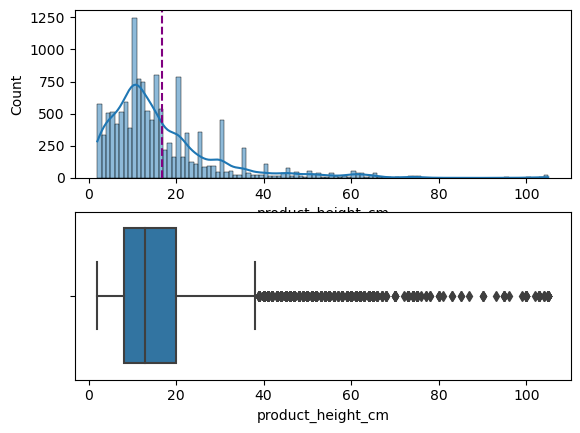

DATA TIDAK SKEWED
count    13640.000000
mean        16.728959
std         13.608740
min          2.000000
25%          8.000000
50%         13.000000
75%         20.000000
max        105.000000
Name: product_height_cm, dtype: float64
iqr : 12.0
lower whisker: 2.0
upper whisker: 38.0
outlier: [61.0, 50.0, 47.0, 40.0, 50.0, 40.0, 41.0, 43.0, 44.0, 40.0, 61.0, 53.0, 55.0, 50.0, 60.0, 45.0, 47.0, 55.0, 61.0, 52.0, 50.0, 40.0, 42.0, 49.0, 45.0, 62.0, 52.0, 60.0, 74.0, 60.0, 40.0, 63.0, 50.0, 48.0, 55.0, 65.0, 52.0, 40.0, 74.0, 40.0, 45.0, 64.0, 62.0, 63.0, 52.0, 103.0, 58.0, 64.0, 40.0, 45.0, 50.0, 47.0, 105.0, 40.0, 65.0, 64.0, 55.0, 40.0, 100.0, 105.0, 40.0, 39.0, 60.0, 64.0, 52.0, 40.0, 55.0, 62.0, 46.0, 44.0, 61.0, 60.0, 99.0, 40.0, 39.0, 51.0, 57.0, 65.0, 50.0, 64.0, 46.0, 56.0, 50.0, 95.0, 80.0, 47.0, 61.0, 60.0, 44.0, 43.0, 64.0, 51.0, 42.0, 75.0, 50.0, 40.0, 65.0, 65.0, 44.0, 39.0, 40.0, 62.0, 45.0, 60.0, 100.0, 75.0, 40.0, 40.0, 40.0, 48.0, 103.0, 60.0, 40.0, 47.0, 55.0, 58.0, 52.0

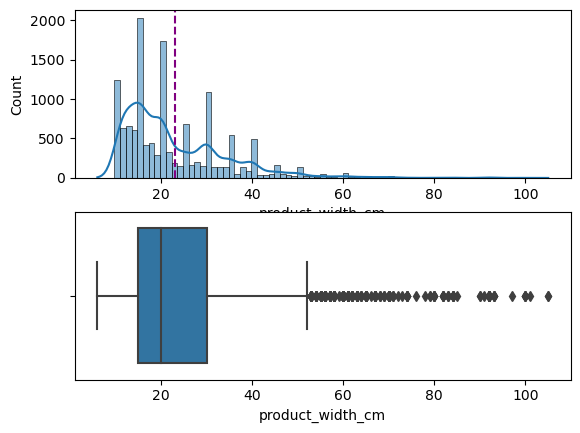

DATA TIDAK SKEWED
count    13640.000000
mean        23.144941
std         11.739437
min          6.000000
25%         15.000000
50%         20.000000
75%         30.000000
max        105.000000
Name: product_width_cm, dtype: float64
iqr : 15.0
lower whisker: 6.0
upper whisker: 52.0
outlier: [82.0, 92.0, 70.0, 91.0, 70.0, 74.0, 67.0, 80.0, 70.0, 53.0, 60.0, 53.0, 71.0, 65.0, 74.0, 61.0, 60.0, 92.0, 61.0, 82.0, 60.0, 83.0, 61.0, 80.0, 53.0, 55.0, 70.0, 70.0, 60.0, 55.0, 78.0, 60.0, 62.0, 55.0, 60.0, 53.0, 63.0, 58.0, 55.0, 70.0, 56.0, 65.0, 55.0, 92.0, 65.0, 53.0, 74.0, 63.0, 60.0, 63.0, 69.0, 92.0, 55.0, 60.0, 65.0, 83.0, 85.0, 61.0, 93.0, 68.0, 58.0, 56.0, 67.0, 72.0, 61.0, 71.0, 60.0, 79.0, 53.0, 65.0, 84.0, 97.0, 93.0, 74.0, 58.0, 92.0, 70.0, 53.0, 53.0, 65.0, 55.0, 55.0, 67.0, 60.0, 55.0, 70.0, 74.0, 92.0, 67.0, 65.0, 90.0, 63.0, 63.0, 100.0, 57.0, 58.0, 65.0, 70.0, 53.0, 55.0, 56.0, 65.0, 54.0, 105.0, 70.0, 70.0, 65.0, 66.0, 69.0, 54.0, 67.0, 58.0, 65.0, 56.0, 60.0, 60.0, 55.0, 57.

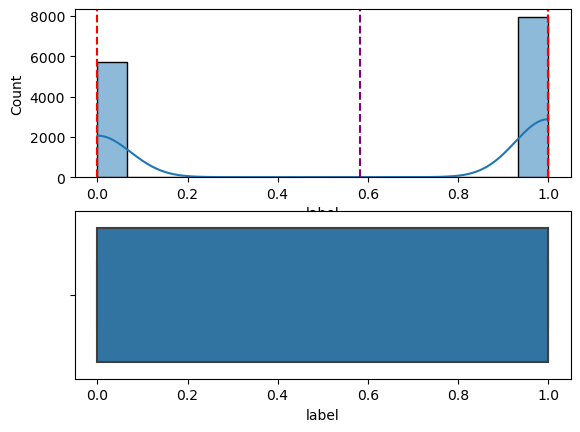

DATA SKEWED ,dengan nilai skew: -0.33482660006845766
count    13645.000000
mean         0.582558
std          0.493155
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: label, dtype: float64
iqr : 1.0
lower whisker: 0
upper whisker: 1
outlier: []
outlier counts: 0
**************************************************


In [15]:
#Membuat fungsi whisk untuk menentukan data outlier
def whisk(x):

    q1=np.nanpercentile(x,25)
    q3=np.nanpercentile(x,75)
    iqr=q3-q1
    lower_fence=q1-1.5*iqr
    upper_fence=q3+1.5*iqr
    
    #Mengidentifikasi non-outlier menggunakan lower dan upper fence
    non_outlier=[]
    for num in x:
        if num >= lower_fence:
            if num <= upper_fence:
                non_outlier.append(num)
    lower_whisker=np.min(non_outlier)
    upper_whisker=np.max(non_outlier)
    
    #Mengidentifikasi outlier menggunakan lower dan upper fence
    outlier=[]
    for num in x:
        if num < lower_fence:
            outlier.append(num)
        if num > upper_fence:
            outlier.append(num)
    
    outlier_count = len(outlier)
    
    print('iqr : {}'.format(iqr))
    print('lower whisker: {}'.format(lower_whisker))
    print('upper whisker: {}'.format(upper_whisker))
    print('outlier: {}'.format(outlier))
    print('outlier counts: {}'.format(outlier_count))
    
number=1
for x in md_num.columns:
    print(number)
    print(x)
    #Membuat histogram dan boxplot
    fig, axs=plt.subplots(2,1)
    sns.histplot(data=md_num, x=x, kde=True, ax=axs[0])
    axs[0].axvline(np.percentile(md_num[x], 25), color='red', linestyle='--')
    axs[0].axvline(np.percentile(md_num[x], 50), color='red', linestyle='--')
    axs[0].axvline(np.percentile(md_num[x], 75), color='red', linestyle='--')
    axs[0].axvline(np.mean(md_num[x]), color='purple', linestyle='--')
    sns.boxplot(data=md_num, x=x, ax=axs[1])
    plt.show()
    #Menghitung Skew
    sk=skew(md_num[x])
    stat, p_value=skewtest(md_num[x])
    if p_value < 0.05:
        print('DATA SKEWED ,dengan nilai skew: {}'.format(sk))
    else:
        print('DATA TIDAK SKEWED')
        
    # metode describe
    print(md_num[x].describe())
    # lower_whisker, upper_whisker, outlier, outlier_count
    whisk(md_num[x])
    
    print('*'*50)
    number += 1

#### Categorical

1
customer_state


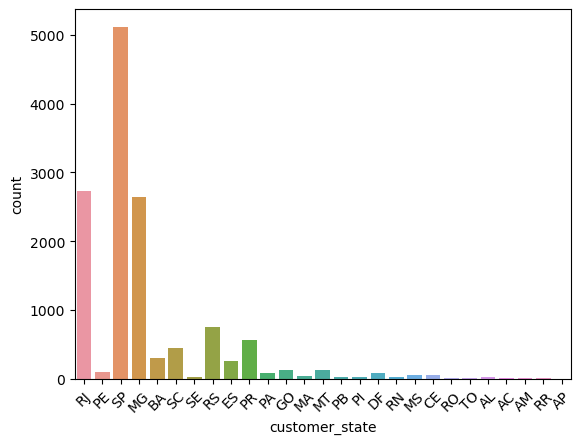

SP    5118
RJ    2734
MG    2648
RS     755
PR     557
SC     454
BA     305
ES     255
GO     130
MT     123
PE      99
DF      81
PA      78
MS      50
CE      48
MA      37
AL      30
PB      28
RN      24
PI      22
SE      21
RO      16
TO      13
AC       7
RR       5
AM       4
AP       3
Name: customer_state, dtype: int64
SP    0.375082
RJ    0.200366
MG    0.194064
RS    0.055332
PR    0.040821
SC    0.033272
BA    0.022353
ES    0.018688
GO    0.009527
MT    0.009014
PE    0.007255
DF    0.005936
PA    0.005716
MS    0.003664
CE    0.003518
MA    0.002712
AL    0.002199
PB    0.002052
RN    0.001759
PI    0.001612
SE    0.001539
RO    0.001173
TO    0.000953
AC    0.000513
RR    0.000366
AM    0.000293
AP    0.000220
Name: customer_state, dtype: float64
unique values:['RJ' 'PE' 'SP' 'MG' 'BA' 'SC' 'SE' 'RS' 'ES' 'PR' 'PA' 'GO' 'MA' 'MT'
 'PB' 'PI' 'DF' 'RN' 'MS' 'CE' 'RO' 'TO' 'AL' 'AC' 'AM' 'RR' 'AP']
unique values counts:27.
2
geolocation_state


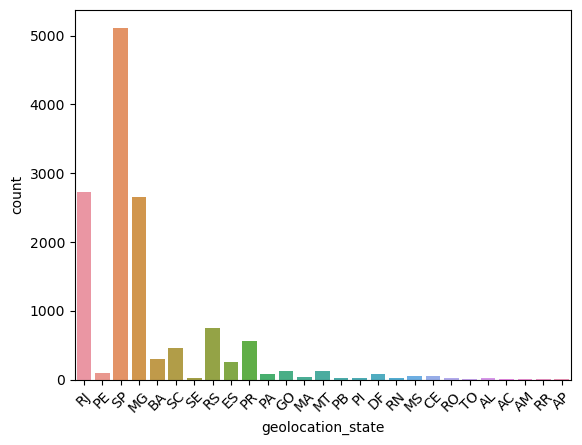

SP    5118
RJ    2734
MG    2648
RS     755
PR     557
SC     454
BA     305
ES     255
GO     130
MT     123
PE      99
DF      81
PA      78
MS      50
CE      48
MA      37
AL      30
PB      28
RN      24
PI      22
SE      21
RO      16
TO      13
AC       7
RR       5
AM       4
AP       3
Name: geolocation_state, dtype: int64
SP    0.375082
RJ    0.200366
MG    0.194064
RS    0.055332
PR    0.040821
SC    0.033272
BA    0.022353
ES    0.018688
GO    0.009527
MT    0.009014
PE    0.007255
DF    0.005936
PA    0.005716
MS    0.003664
CE    0.003518
MA    0.002712
AL    0.002199
PB    0.002052
RN    0.001759
PI    0.001612
SE    0.001539
RO    0.001173
TO    0.000953
AC    0.000513
RR    0.000366
AM    0.000293
AP    0.000220
Name: geolocation_state, dtype: float64
unique values:['RJ' 'PE' 'SP' 'MG' 'BA' 'SC' 'SE' 'RS' 'ES' 'PR' 'PA' 'GO' 'MA' 'MT'
 'PB' 'PI' 'DF' 'RN' 'MS' 'CE' 'RO' 'TO' 'AL' 'AC' 'AM' 'RR' 'AP']
unique values counts:27.
3
payment_type


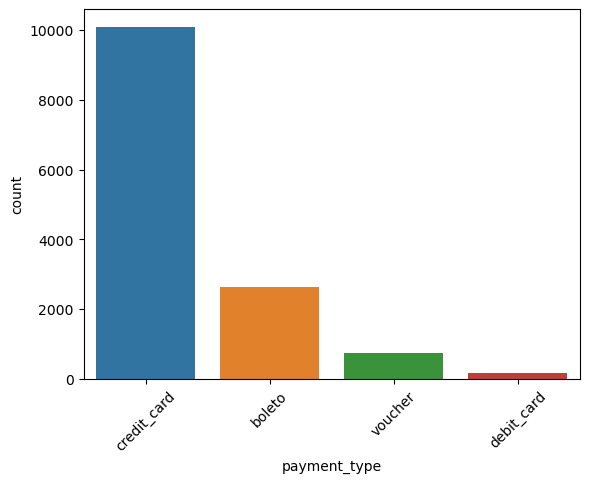

credit_card    10095
boleto          2633
voucher          739
debit_card       177
Name: payment_type, dtype: int64
credit_card    0.739886
boleto         0.192979
voucher        0.054163
debit_card     0.012973
Name: payment_type, dtype: float64
unique values:['credit_card' 'boleto' 'voucher' 'debit_card' nan]
unique values counts:5.
4
product_category_name


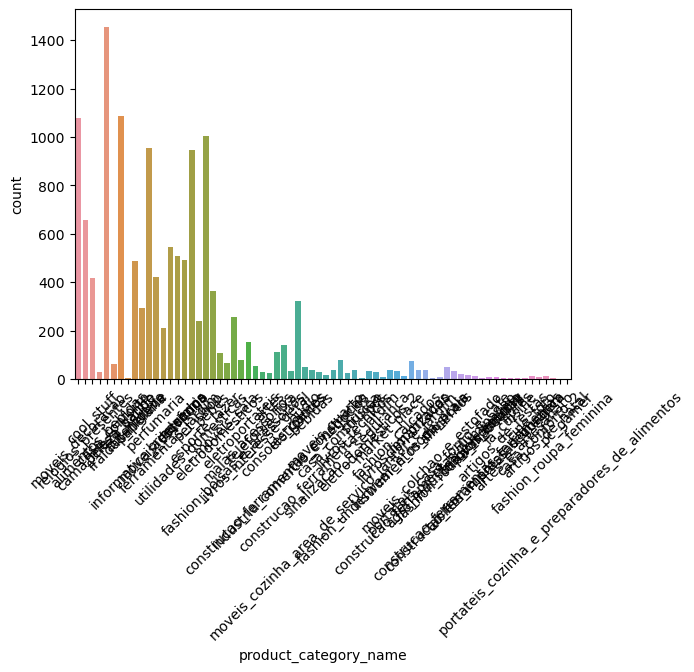

cama_mesa_banho                                  1455
beleza_saude                                     1086
moveis_decoracao                                 1077
esporte_lazer                                    1003
informatica_acessorios                            954
                                                 ... 
artes_e_artesanato                                  4
fashion_roupa_feminina                              3
artigos_de_festas                                   3
pc_gamer                                            1
portateis_cozinha_e_preparadores_de_alimentos       1
Name: product_category_name, Length: 70, dtype: int64
cama_mesa_banho                                  0.108154
beleza_saude                                     0.080725
moveis_decoracao                                 0.080056
esporte_lazer                                    0.074556
informatica_acessorios                           0.070914
                                                   ...   
arte

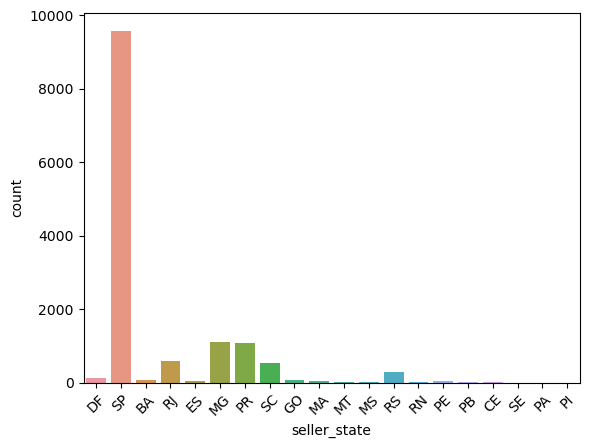

SP    9586
MG    1106
PR    1082
RJ     599
SC     542
RS     280
DF     133
GO      72
BA      65
PE      49
MA      46
ES      34
MT      23
CE       7
MS       7
PB       6
RN       4
SE       2
PI       1
PA       1
Name: seller_state, dtype: int64
SP    0.702528
MG    0.081055
PR    0.079296
RJ    0.043899
SC    0.039722
RS    0.020520
DF    0.009747
GO    0.005277
BA    0.004764
PE    0.003591
MA    0.003371
ES    0.002492
MT    0.001686
CE    0.000513
MS    0.000513
PB    0.000440
RN    0.000293
SE    0.000147
PI    0.000073
PA    0.000073
Name: seller_state, dtype: float64
unique values:['DF' 'SP' 'BA' 'RJ' 'ES' 'MG' 'PR' 'SC' 'GO' 'MA' 'MT' 'MS' 'RS' 'RN'
 'PE' 'PB' 'CE' 'SE' 'PA' 'PI']
unique values counts:20.
6
product_category_name_english


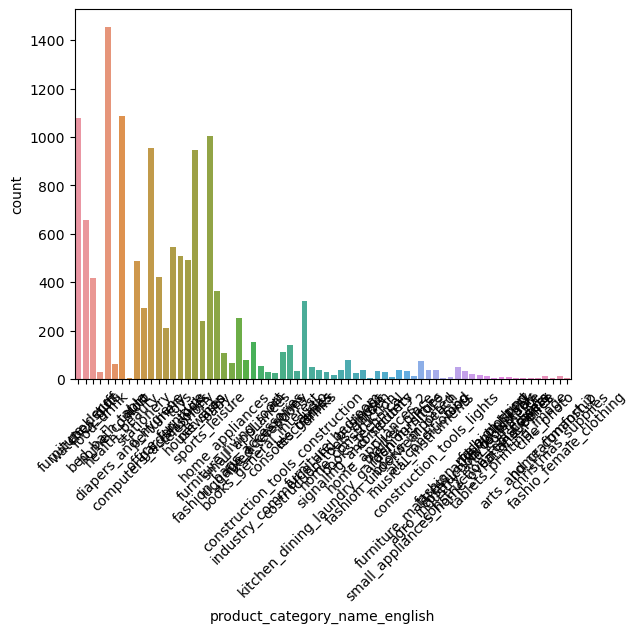

bed_bath_table                       1455
health_beauty                        1086
furniture_decor                      1077
sports_leisure                       1003
computers_accessories                 954
                                     ... 
la_cuisine                              4
furniture_mattress_and_upholstery       4
arts_and_craftmanship                   4
party_supplies                          3
fashio_female_clothing                  3
Name: product_category_name_english, Length: 68, dtype: int64
bed_bath_table                       0.108170
health_beauty                        0.080737
furniture_decor                      0.080068
sports_leisure                       0.074567
computers_accessories                0.070924
                                       ...   
la_cuisine                           0.000297
furniture_mattress_and_upholstery    0.000297
arts_and_craftmanship                0.000297
party_supplies                       0.000223
fashio_female_cl

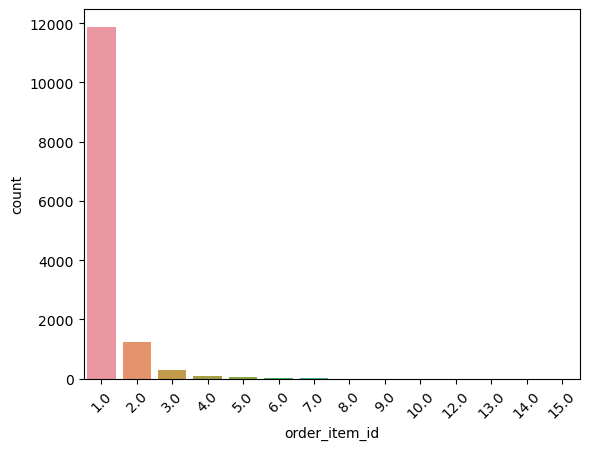

1.0     11879
2.0      1253
3.0       281
4.0       108
5.0        59
6.0        35
7.0         9
8.0         6
12.0        6
10.0        5
15.0        1
9.0         1
14.0        1
13.0        1
Name: order_item_id, dtype: int64
1.0     0.870575
2.0     0.091829
3.0     0.020594
4.0     0.007915
5.0     0.004324
6.0     0.002565
7.0     0.000660
8.0     0.000440
12.0    0.000440
10.0    0.000366
15.0    0.000073
9.0     0.000073
14.0    0.000073
13.0    0.000073
Name: order_item_id, dtype: float64
unique values:[ 1.  2. 10.  3.  5.  4.  6.  7. 12.  8. 15. 14.  9. 13.]
unique values counts:14.
8
payment_sequential


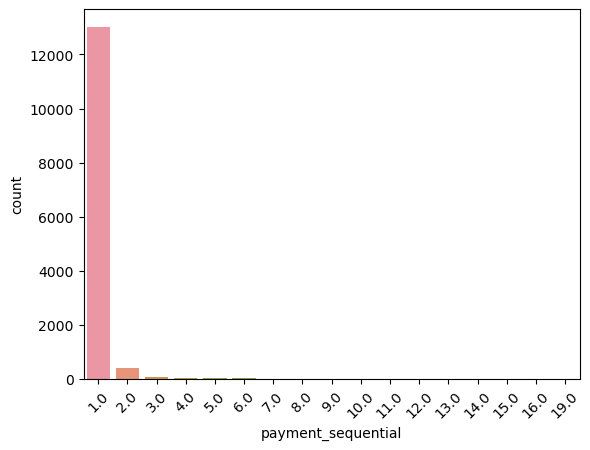

1.0     13025
2.0       410
3.0        79
4.0        41
6.0        23
5.0        23
8.0         9
10.0        7
7.0         6
9.0         6
11.0        4
14.0        3
12.0        3
16.0        2
13.0        1
19.0        1
15.0        1
Name: payment_sequential, dtype: int64
1.0     0.954632
2.0     0.030050
3.0     0.005790
4.0     0.003005
6.0     0.001686
5.0     0.001686
8.0     0.000660
10.0    0.000513
7.0     0.000440
9.0     0.000440
11.0    0.000293
14.0    0.000220
12.0    0.000220
16.0    0.000147
13.0    0.000073
19.0    0.000073
15.0    0.000073
Name: payment_sequential, dtype: float64
unique values:[ 1.  2. 10.  4.  7.  6.  3.  5.  9.  8. 19. 16. 15. 14. 12. 13. 11. nan]
unique values counts:18.
9
payment_installments


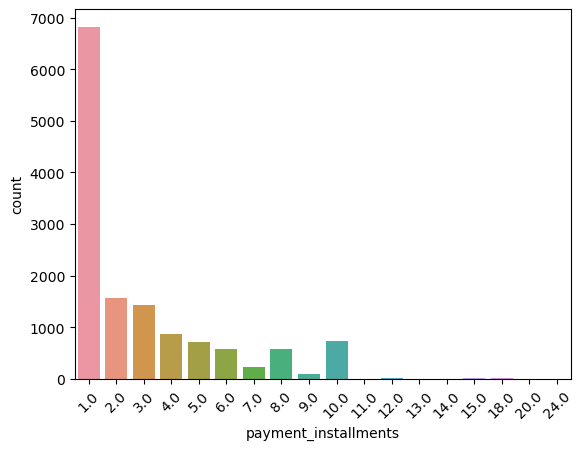

1.0     6826
2.0     1562
3.0     1428
4.0      872
10.0     728
5.0      721
6.0      573
8.0      570
7.0      231
9.0       90
12.0      15
15.0      10
18.0       6
24.0       4
11.0       2
14.0       2
20.0       2
13.0       2
Name: payment_installments, dtype: int64
1.0     0.500293
2.0     0.114483
3.0     0.104661
4.0     0.063911
10.0    0.053357
5.0     0.052844
6.0     0.041996
8.0     0.041777
7.0     0.016931
9.0     0.006596
12.0    0.001099
15.0    0.000733
18.0    0.000440
24.0    0.000293
11.0    0.000147
14.0    0.000147
20.0    0.000147
13.0    0.000147
Name: payment_installments, dtype: float64
unique values:[ 4. 10.  3.  5.  1.  8.  2.  6.  7. 24.  9. 12. 15. 13. 18. 11. 20. nan
 14.]
unique values counts:19.
10
product_photos_qty


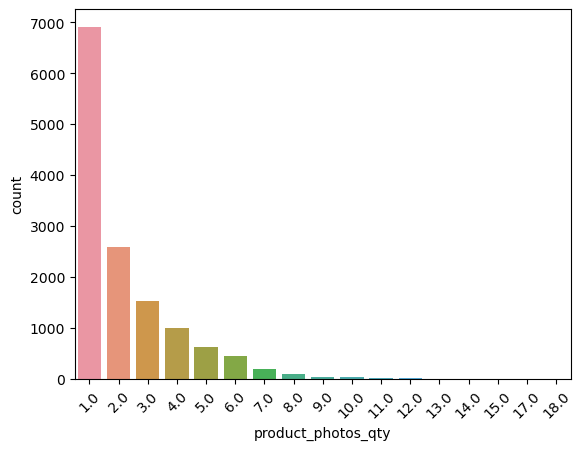

1.0     6911
2.0     2581
3.0     1527
4.0      997
5.0      632
6.0      438
7.0      184
8.0       85
10.0      37
9.0       35
12.0       8
11.0       7
13.0       4
15.0       3
14.0       2
17.0       1
18.0       1
Name: product_photos_qty, dtype: int64
1.0     0.513714
2.0     0.191853
3.0     0.113506
4.0     0.074110
5.0     0.046978
6.0     0.032558
7.0     0.013677
8.0     0.006318
10.0    0.002750
9.0     0.002602
12.0    0.000595
11.0    0.000520
13.0    0.000297
15.0    0.000223
14.0    0.000149
17.0    0.000074
18.0    0.000074
Name: product_photos_qty, dtype: float64
unique values:[ 1.  3.  2.  6.  4.  5.  8.  7. nan  9. 10. 13. 11. 15. 14. 17. 12. 18.]
unique values counts:18.


In [16]:
#Loop countplot setiap kolom dan menentukan jumlah kategori unik, daftar kategori unik dan value counts tiap kategori unik
number = 1
for col in md_cat_all.columns:
    print(number)
    print(col)
    sns.countplot(data = md_cat_all, x = col)
    plt.xticks(rotation=45)
    plt.show()
    print(md_cat_all[col].value_counts())
    print(md_cat_all[col].value_counts(normalize=True))
    print('unique values:{}'.format(md_cat_all[col].unique()))
    print('unique values counts:{}.'.format(len(md_cat_all[col].unique())))
    number += 1

1
geolocation_lat - geolocation_lng


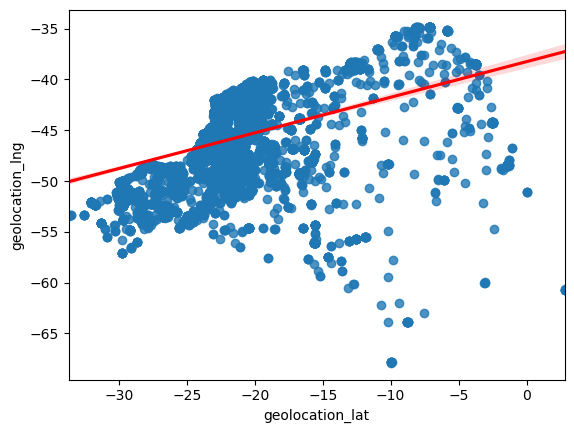

SpearmanrResult(correlation=0.43396598903819816, pvalue=0.0)
**************************************************
2
geolocation_lat - price


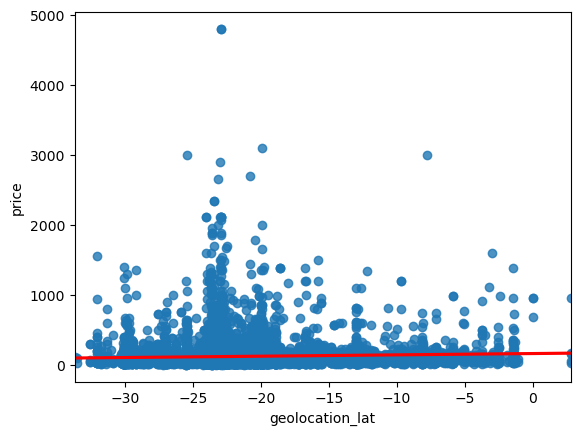

SpearmanrResult(correlation=0.04264811873377138, pvalue=6.240716784510534e-07)
**************************************************
3
geolocation_lat - freight_value


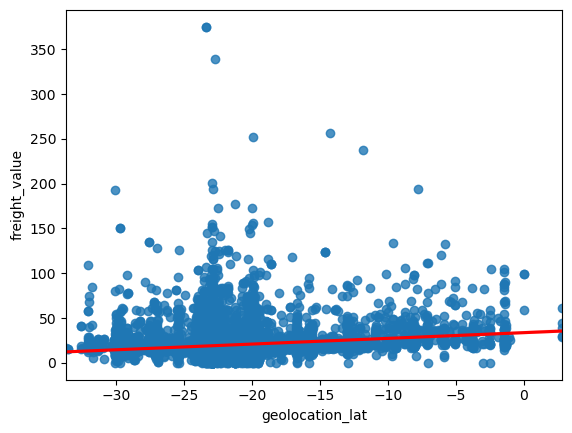

SpearmanrResult(correlation=0.24466567978978038, pvalue=3.7512424371281075e-185)
**************************************************
4
geolocation_lat - payment_value


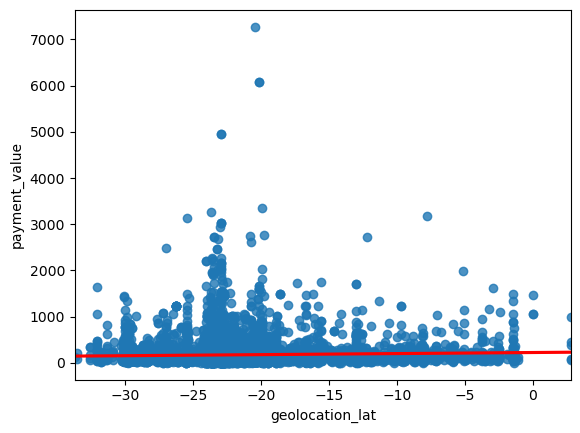

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
5
geolocation_lat - product_name_lenght


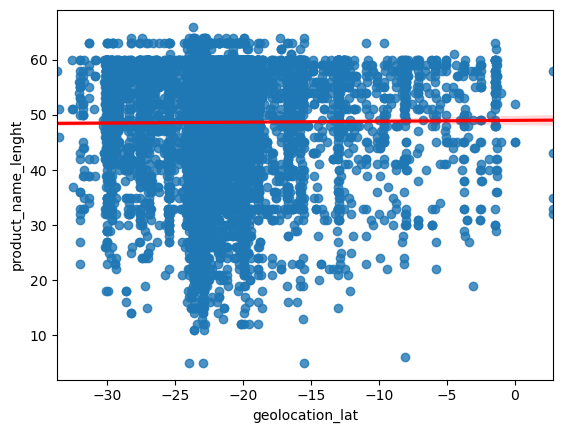

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
6
geolocation_lat - product_description_lenght


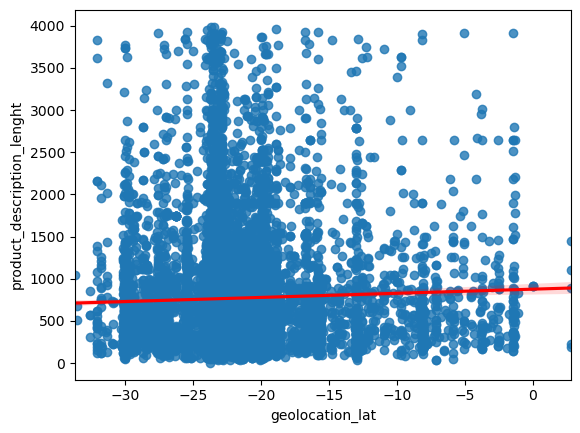

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
7
geolocation_lat - product_weight_g


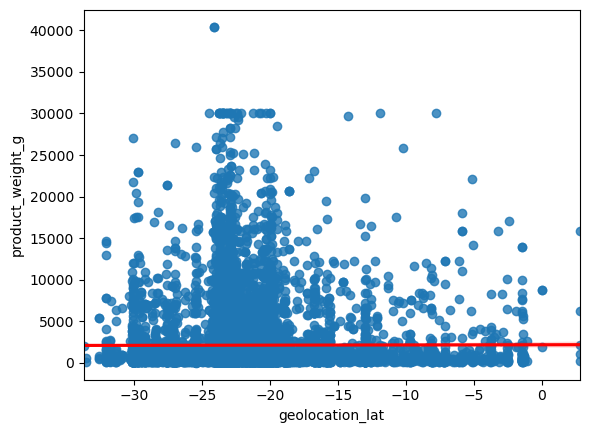

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
8
geolocation_lat - product_length_cm


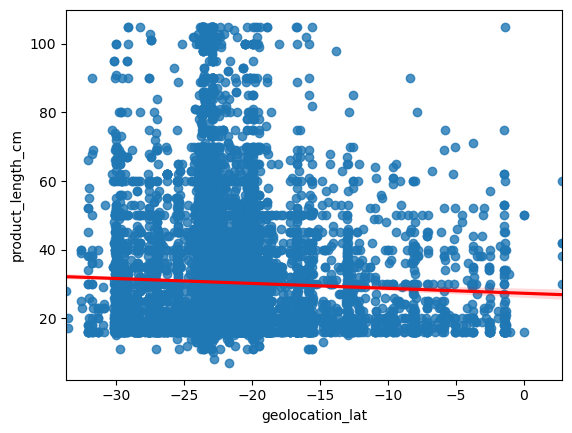

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
9
geolocation_lat - product_height_cm


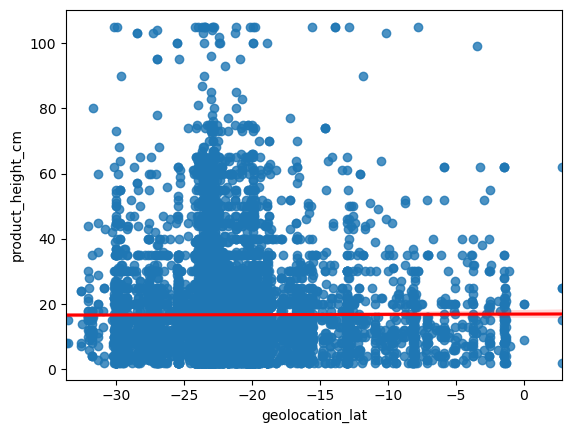

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
10
geolocation_lat - product_width_cm


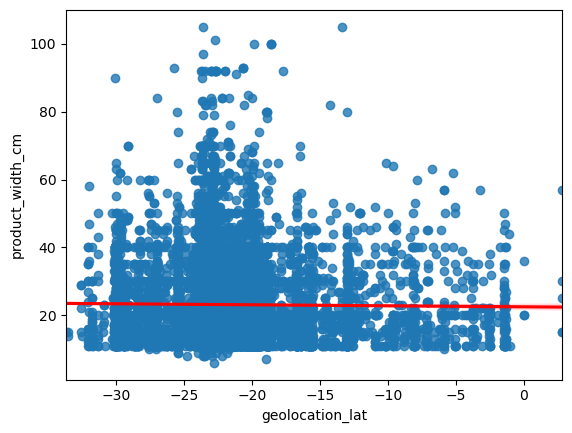

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
11
geolocation_lat - label


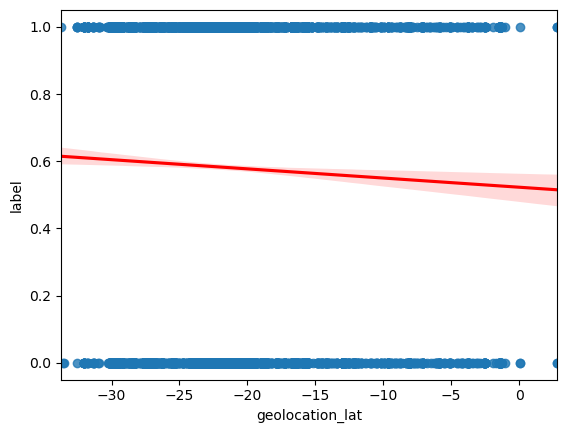

SpearmanrResult(correlation=-0.027818664587058593, pvalue=0.001154537614889279)
**************************************************
12
geolocation_lng - price


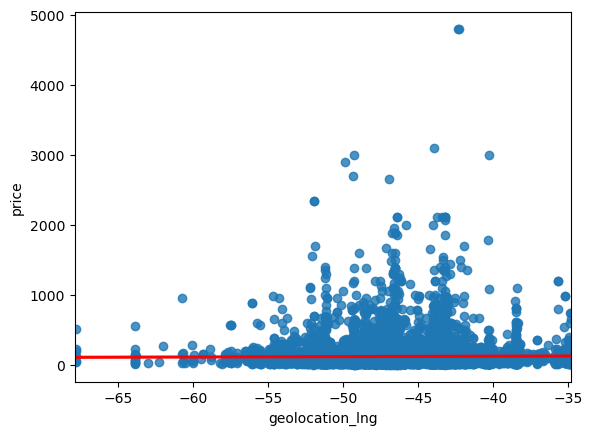

SpearmanrResult(correlation=0.021153907881185048, pvalue=0.013470701088547208)
**************************************************
13
geolocation_lng - freight_value


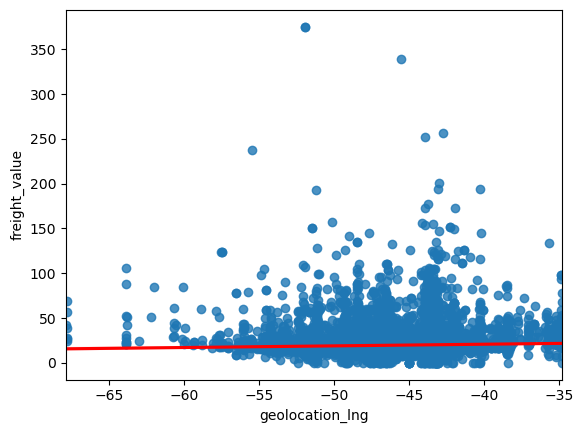

SpearmanrResult(correlation=0.14090702780655542, pvalue=1.8689531181510042e-61)
**************************************************
14
geolocation_lng - payment_value


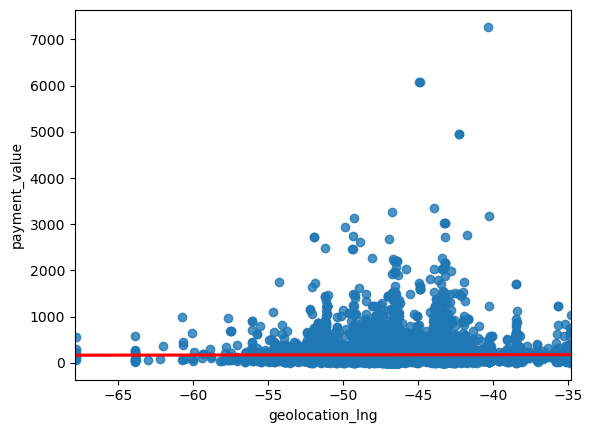

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
15
geolocation_lng - product_name_lenght


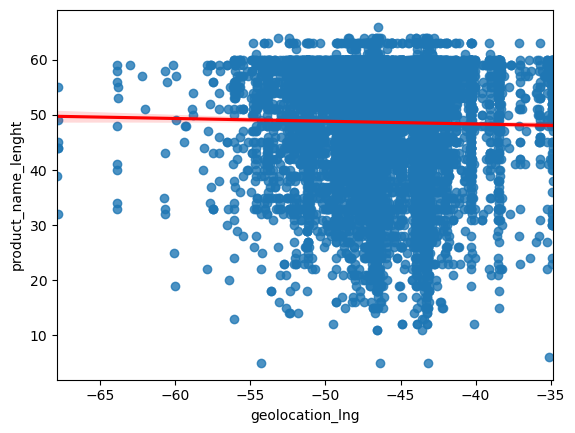

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
16
geolocation_lng - product_description_lenght


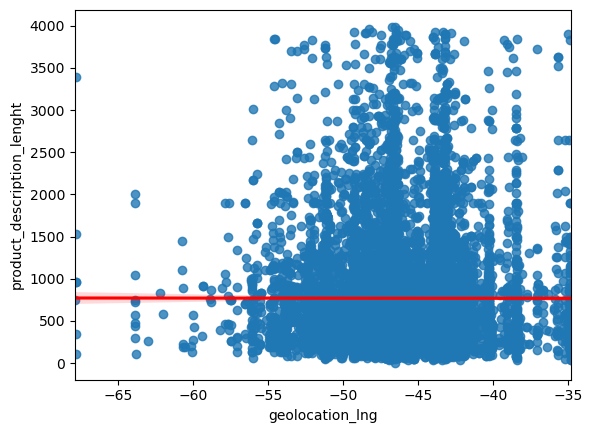

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
17
geolocation_lng - product_weight_g


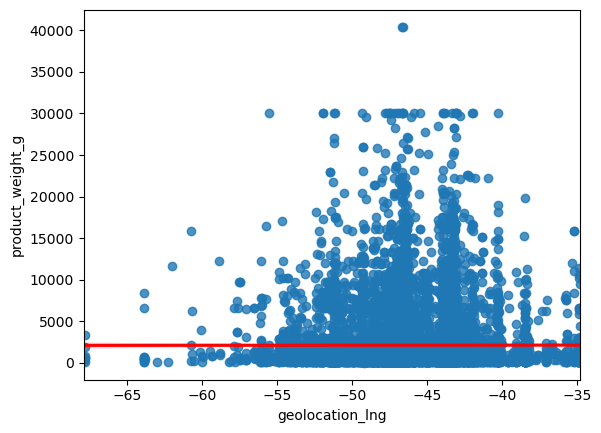

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
18
geolocation_lng - product_length_cm


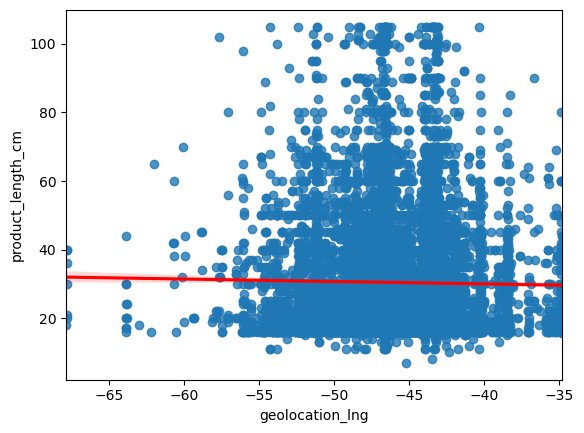

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
19
geolocation_lng - product_height_cm


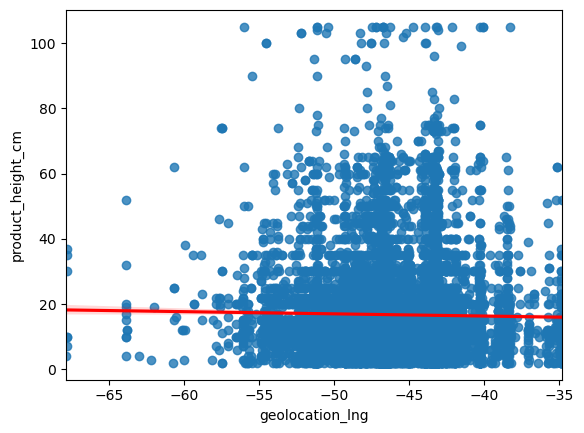

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
20
geolocation_lng - product_width_cm


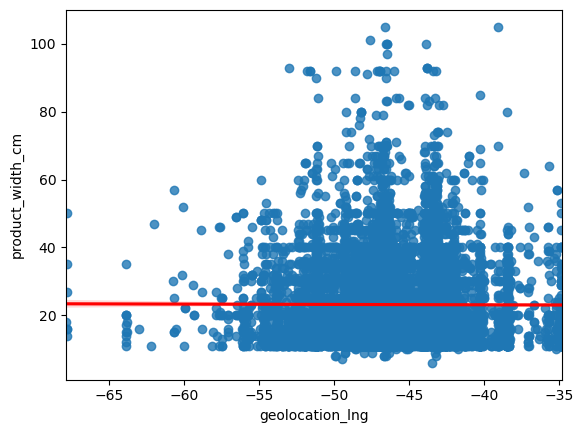

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
21
geolocation_lng - label


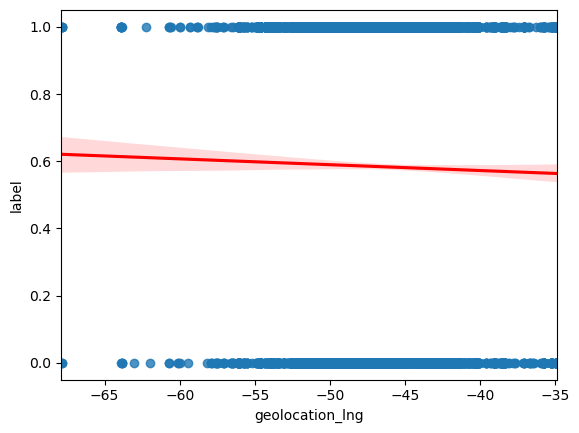

SpearmanrResult(correlation=-0.015225029085216253, pvalue=0.0753376230270133)
**************************************************
22
price - freight_value


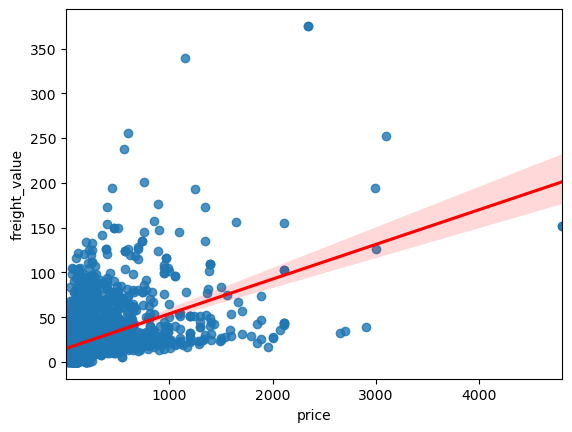

SpearmanrResult(correlation=0.43516466163465534, pvalue=0.0)
**************************************************
23
price - payment_value


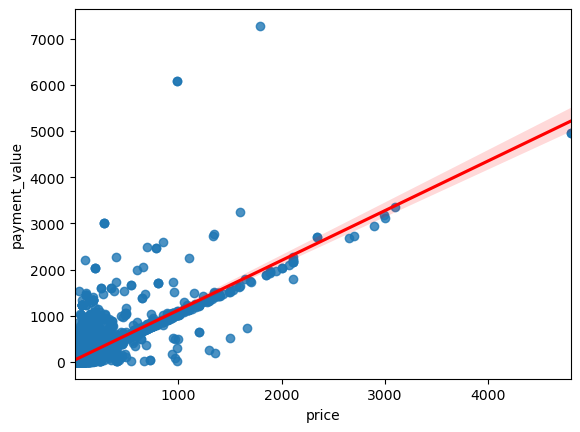

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
24
price - product_name_lenght


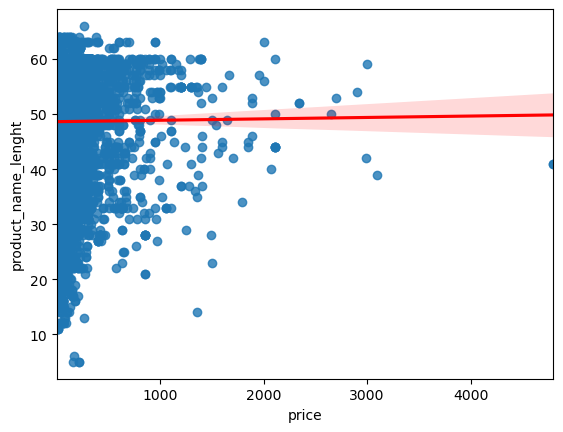

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
25
price - product_description_lenght


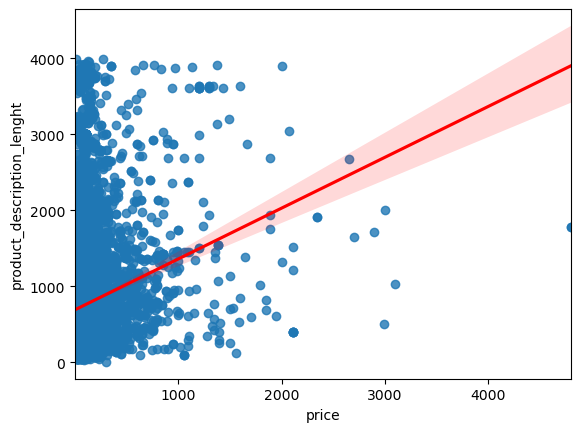

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
26
price - product_weight_g


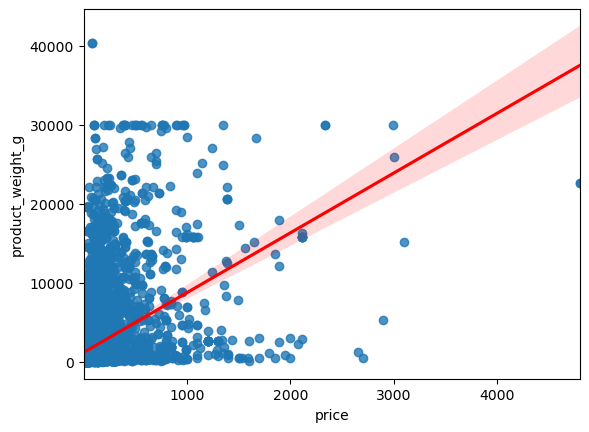

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
27
price - product_length_cm


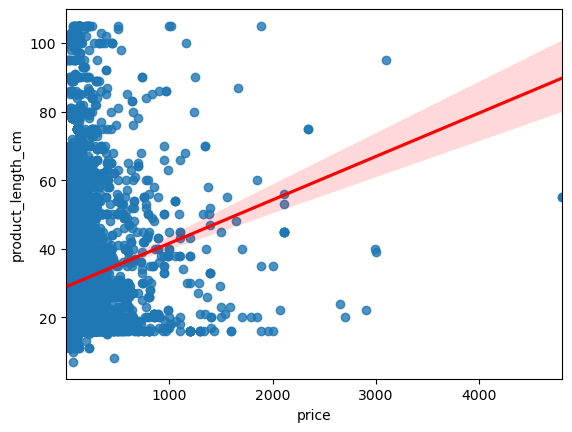

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
28
price - product_height_cm


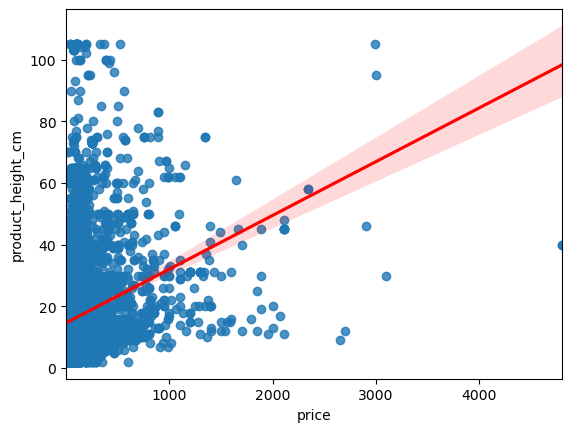

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
29
price - product_width_cm


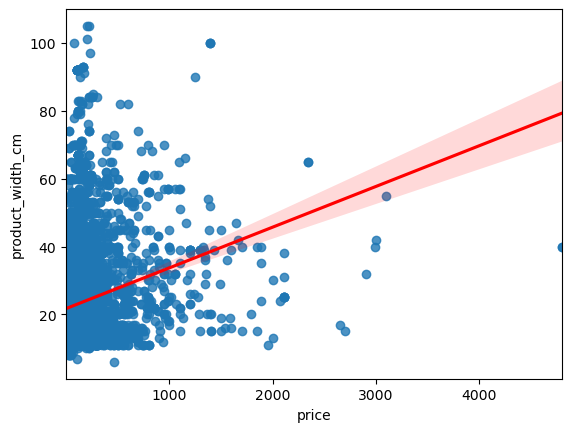

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
30
price - label


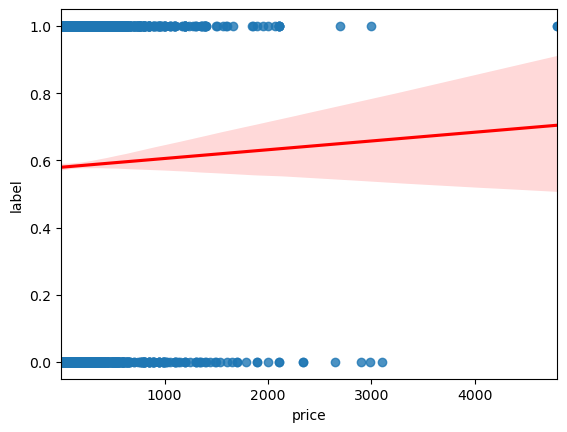

SpearmanrResult(correlation=0.004166626288968311, pvalue=0.6264931294491893)
**************************************************
31
freight_value - payment_value


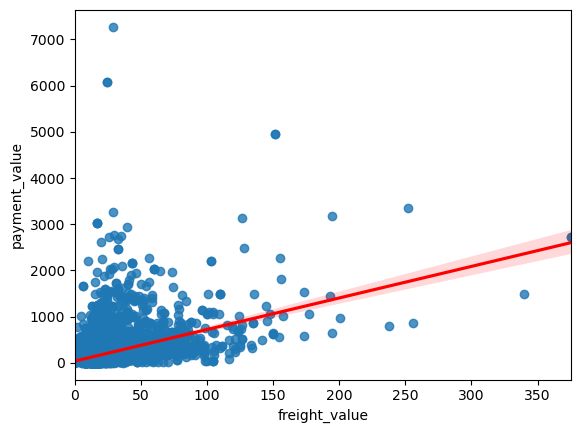

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
32
freight_value - product_name_lenght


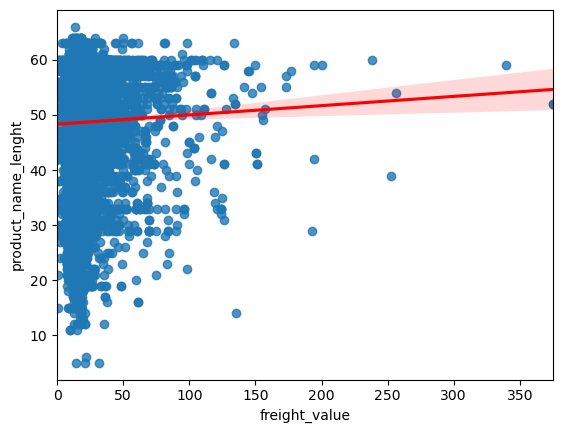

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
33
freight_value - product_description_lenght


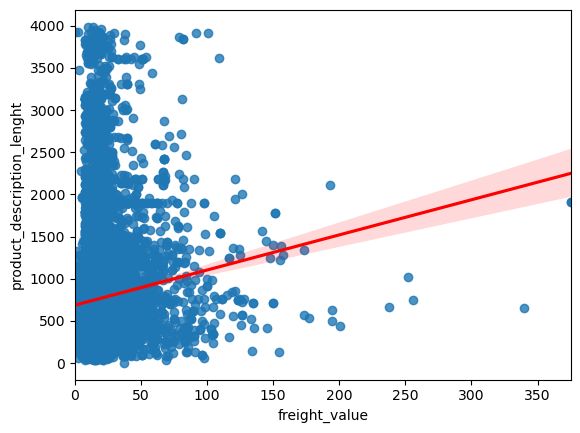

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
34
freight_value - product_weight_g


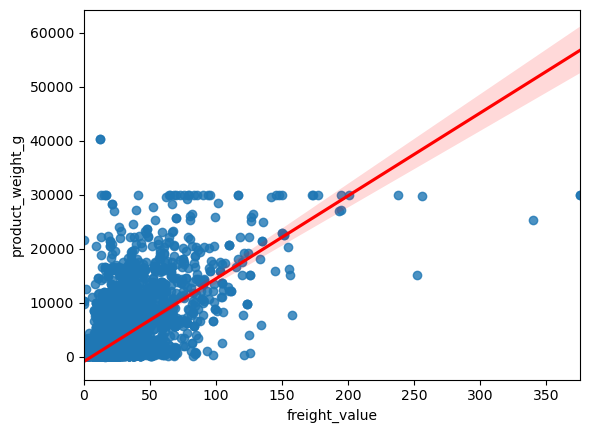

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
35
freight_value - product_length_cm


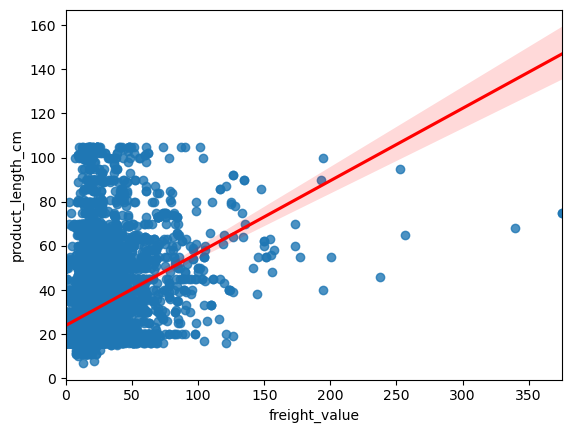

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
36
freight_value - product_height_cm


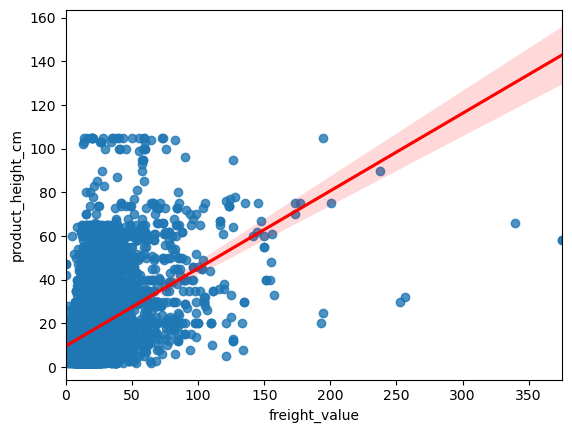

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
37
freight_value - product_width_cm


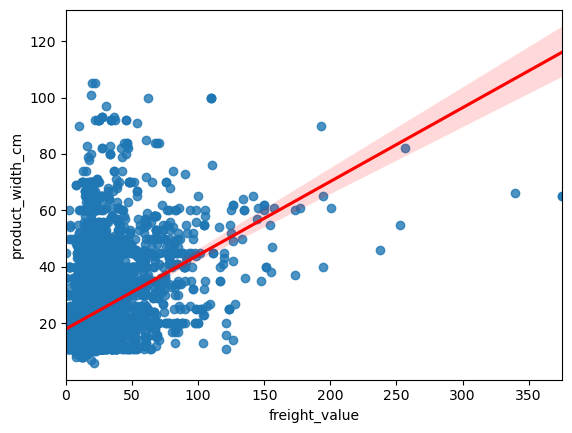

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
38
freight_value - label


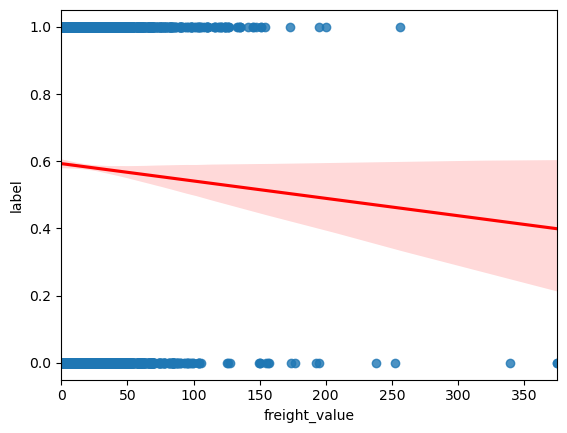

SpearmanrResult(correlation=-0.03400706134154623, pvalue=7.090995889529182e-05)
**************************************************
39
payment_value - product_name_lenght


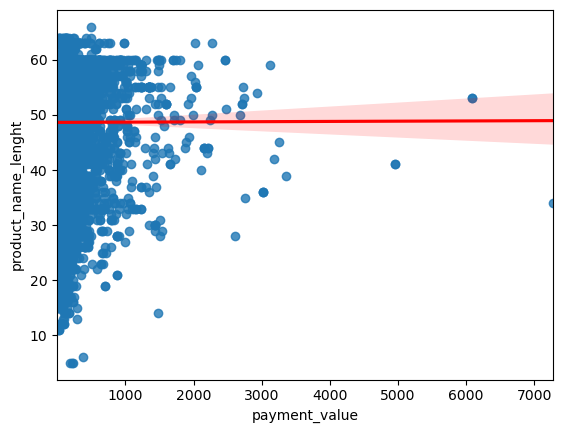

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
40
payment_value - product_description_lenght


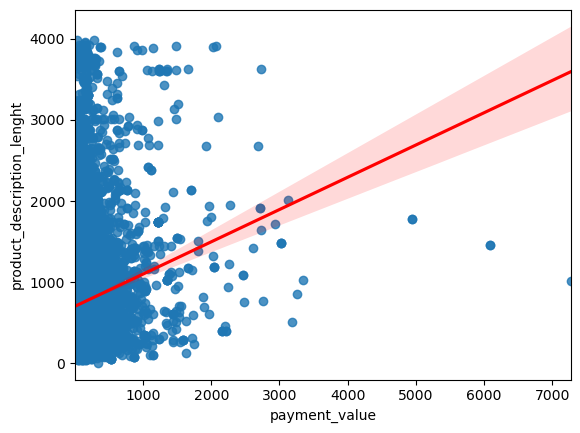

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
41
payment_value - product_weight_g


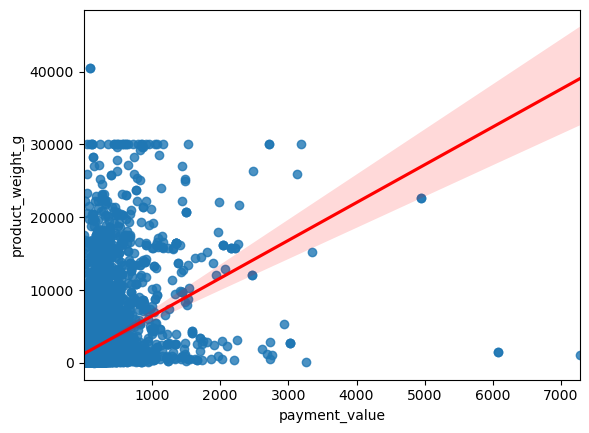

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
42
payment_value - product_length_cm


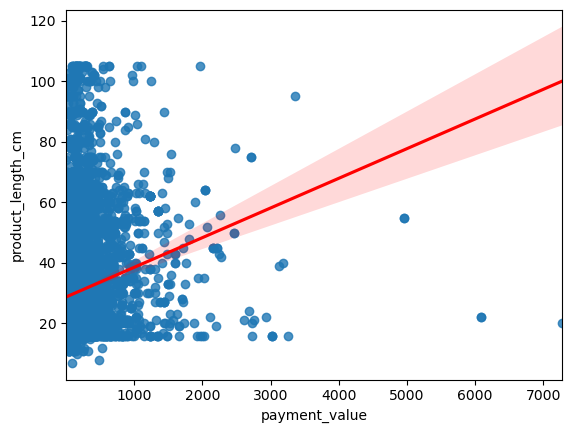

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
43
payment_value - product_height_cm


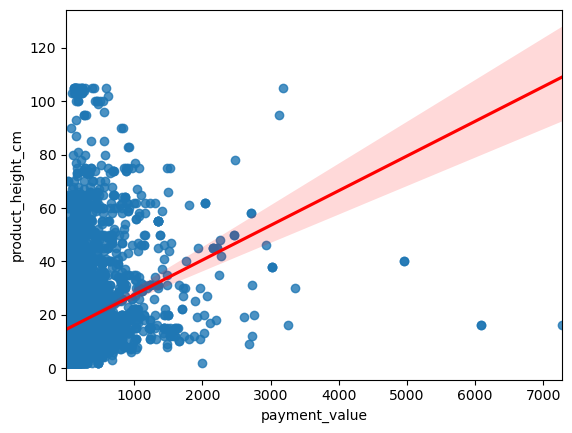

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
44
payment_value - product_width_cm


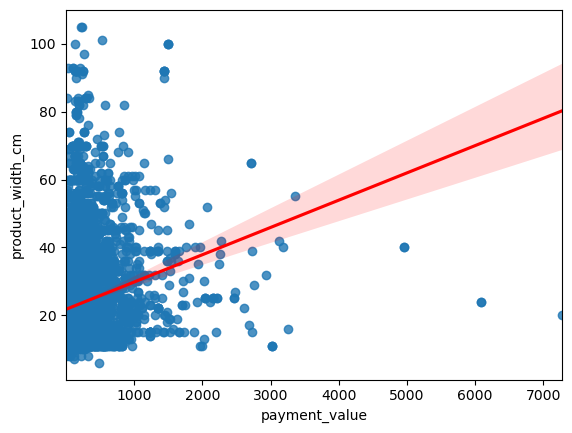

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
45
payment_value - label


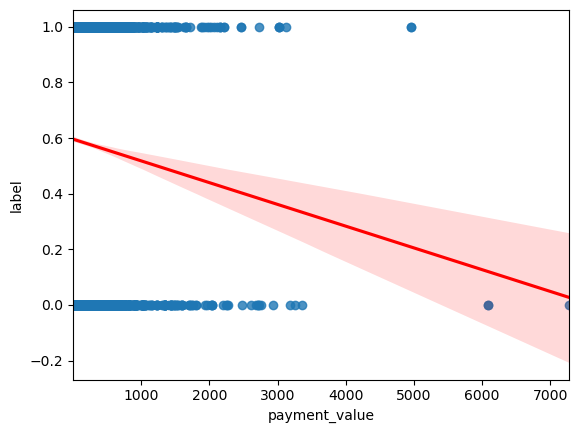

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
46
product_name_lenght - product_description_lenght


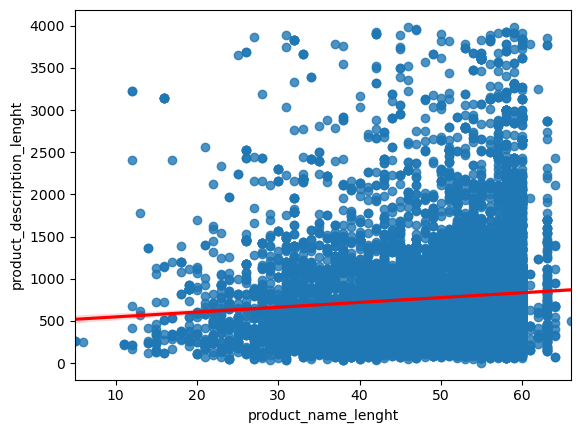

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
47
product_name_lenght - product_weight_g


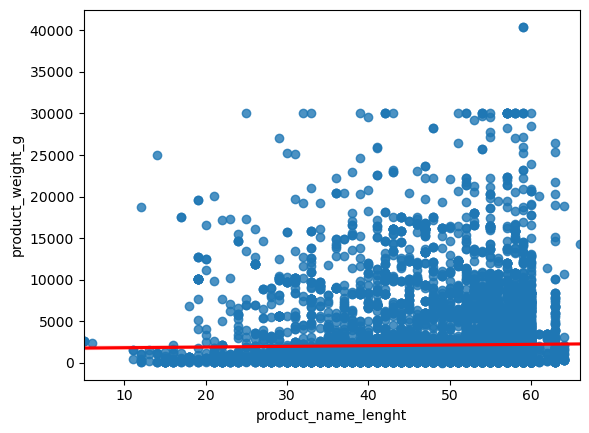

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
48
product_name_lenght - product_length_cm


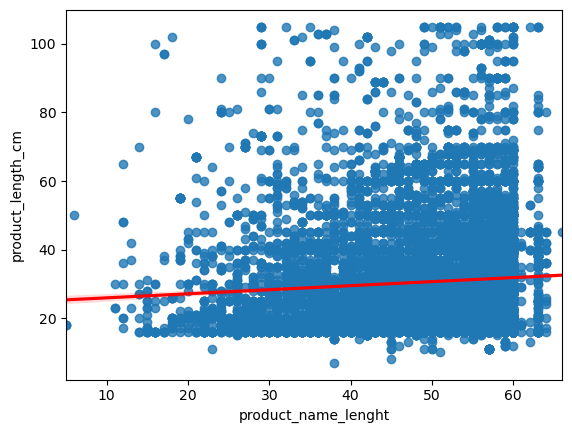

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
49
product_name_lenght - product_height_cm


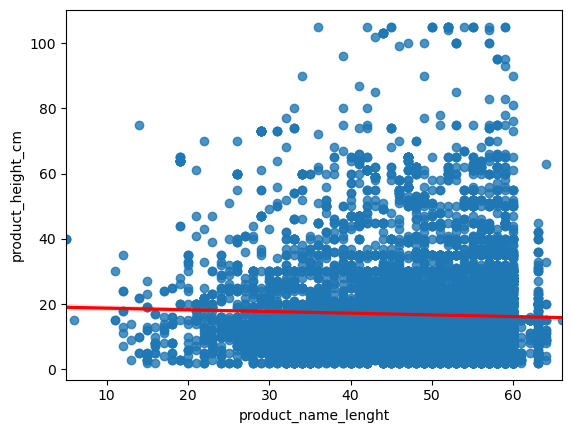

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
50
product_name_lenght - product_width_cm


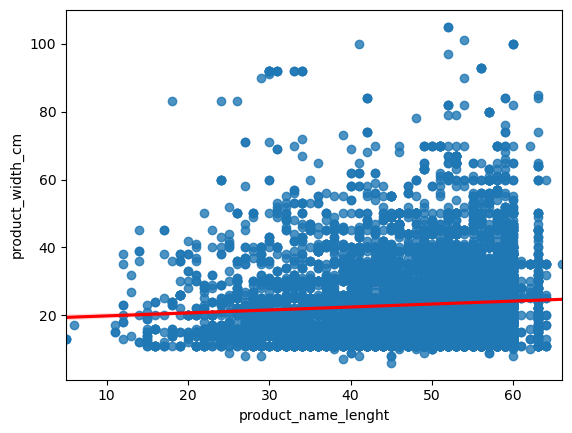

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
51
product_name_lenght - label


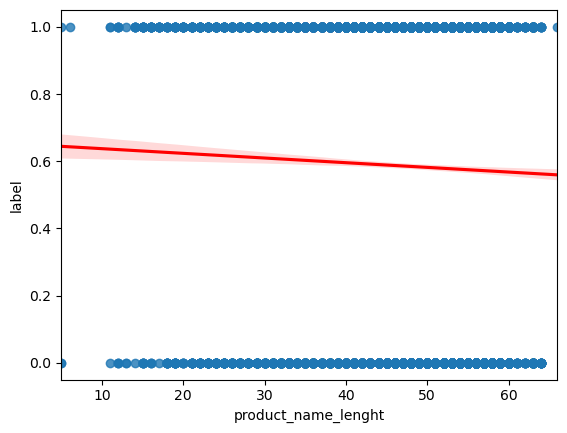

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
52
product_description_lenght - product_weight_g


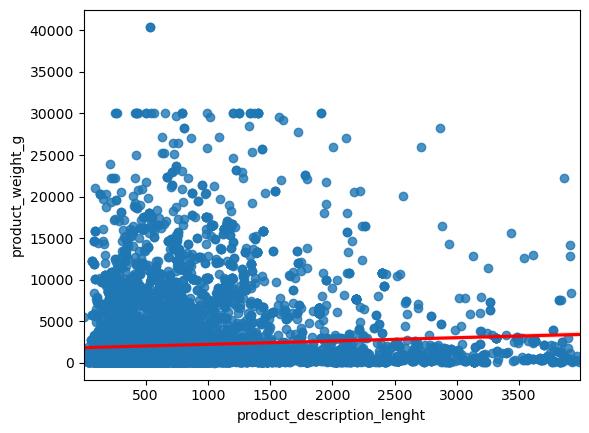

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
53
product_description_lenght - product_length_cm


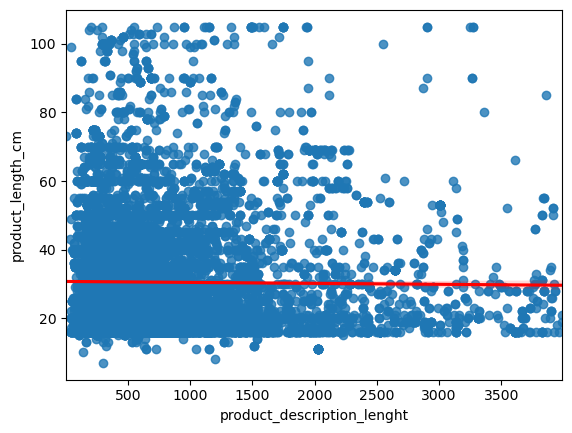

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
54
product_description_lenght - product_height_cm


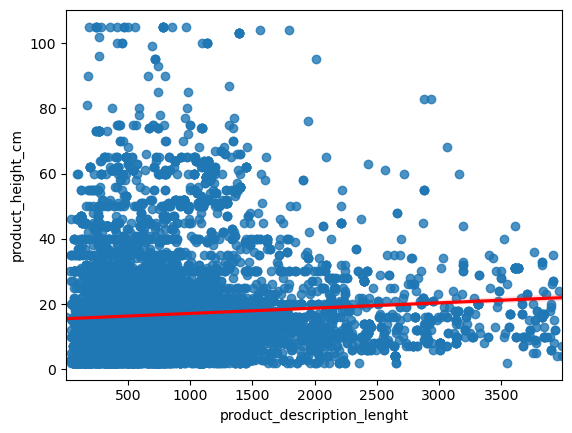

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
55
product_description_lenght - product_width_cm


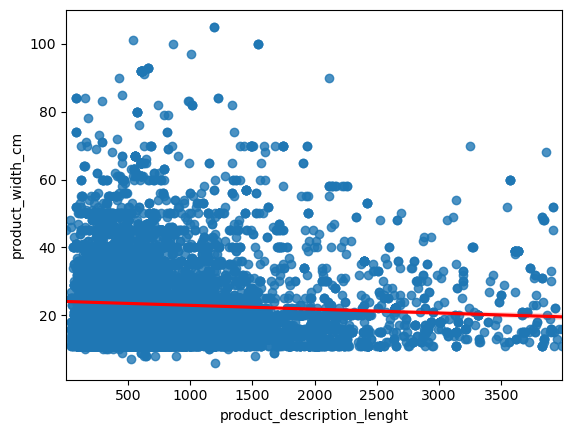

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
56
product_description_lenght - label


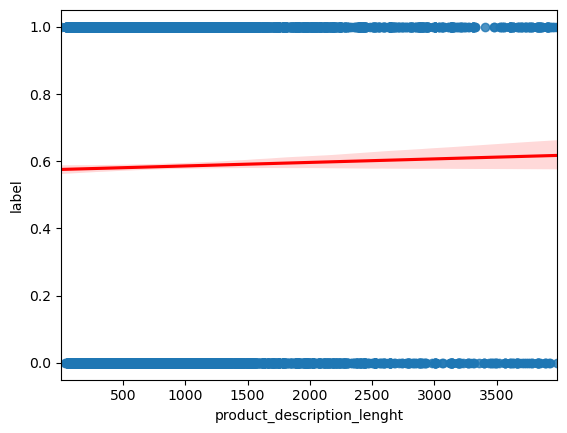

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
57
product_weight_g - product_length_cm


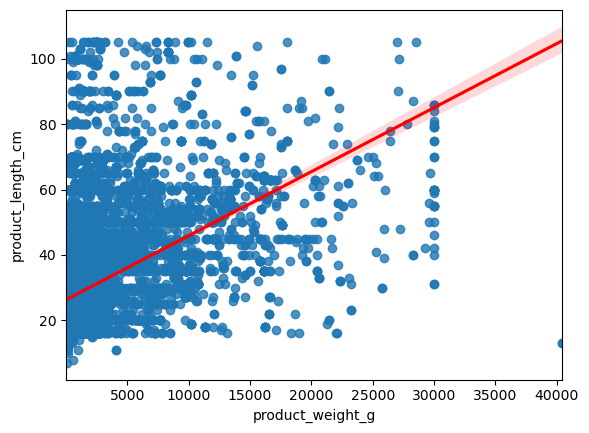

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
58
product_weight_g - product_height_cm


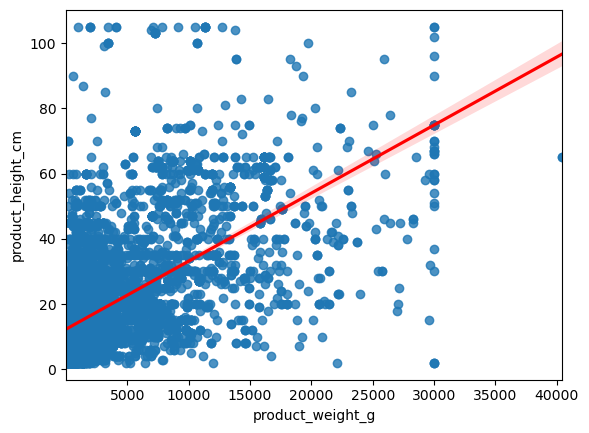

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
59
product_weight_g - product_width_cm


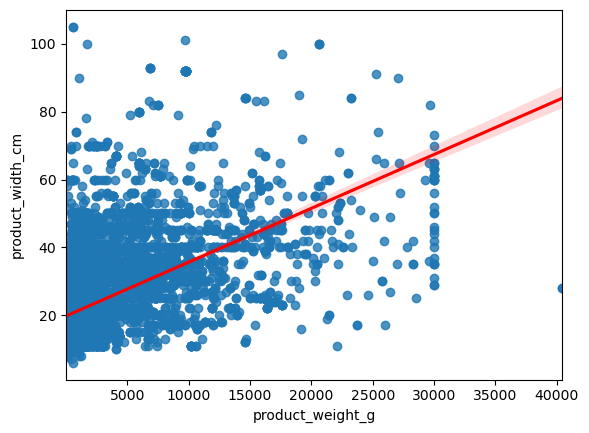

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
60
product_weight_g - label


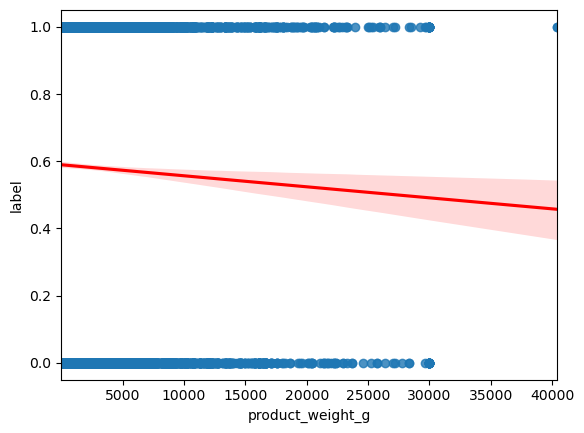

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
61
product_length_cm - product_height_cm


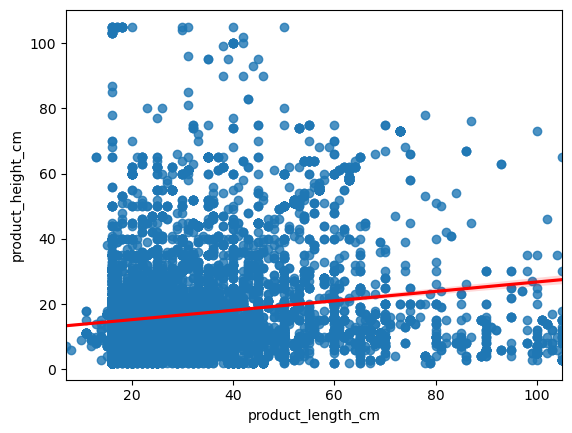

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
62
product_length_cm - product_width_cm


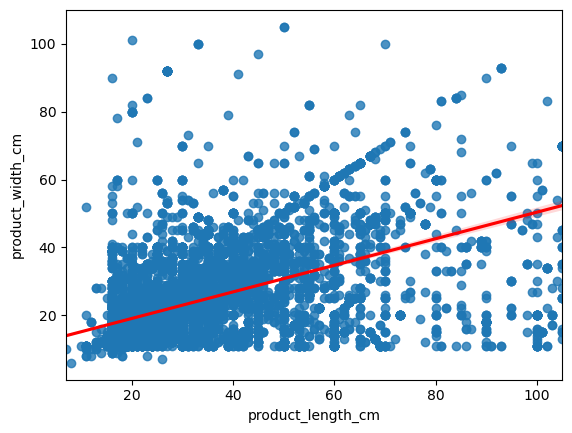

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
63
product_length_cm - label


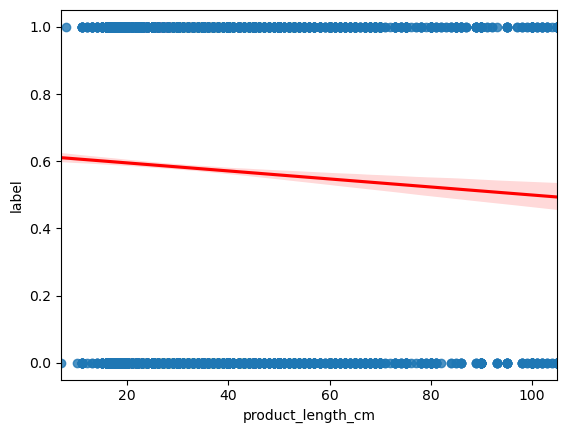

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
64
product_height_cm - product_width_cm


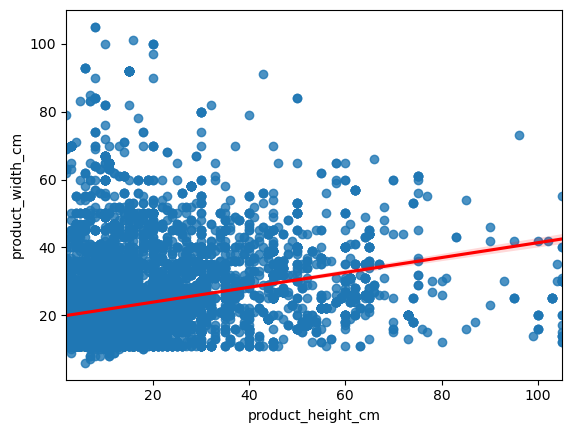

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
65
product_height_cm - label


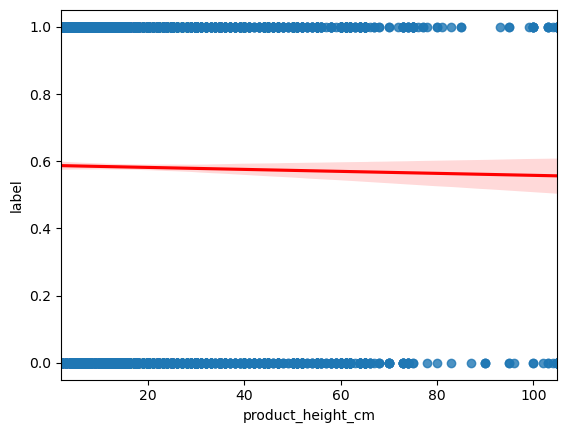

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************
66
product_width_cm - label


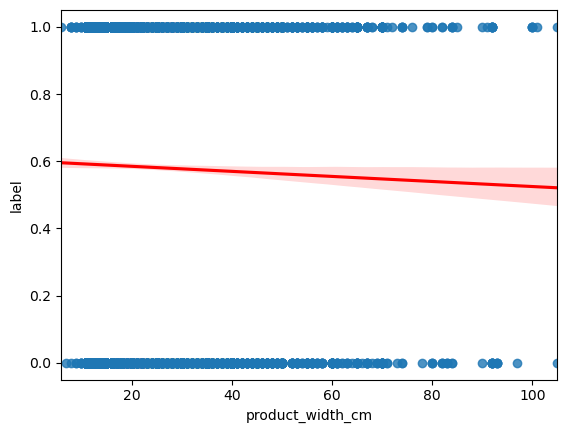

SpearmanrResult(correlation=nan, pvalue=nan)
**************************************************


In [17]:
start = time.time()
done = []
number = 1


for x in md_num.columns:
    for y in md_num.columns:
        if x != y:
            if [y,x] not in done:
                print(number)
                print('{} - {}'.format(x,y))
                
                # Membuat regplot
                sns.regplot(data= md_num, x=x, y=y, line_kws = {'color':'red'})
                plt.show()
                
                #Melakukan normal test
                stats, pvalue = normaltest(md_num[x])
                stats2, pvalue2 = normaltest(md_num[y])
                # apabila kedua fitur normal gunakan pearson, apabila tidak gunakan spearman
                if pvalue > 0.05:
                    if pvalue2 > 0.05:
                        print(pearsonr(md_num[x], md_num[y]))
                else:
                    print(spearmanr(md_num[x], md_num[y]))
                
                print('*' * 50)
                number += 1
                done.append([x,y])
                
end = time.time()

### Multivariat EDA

1


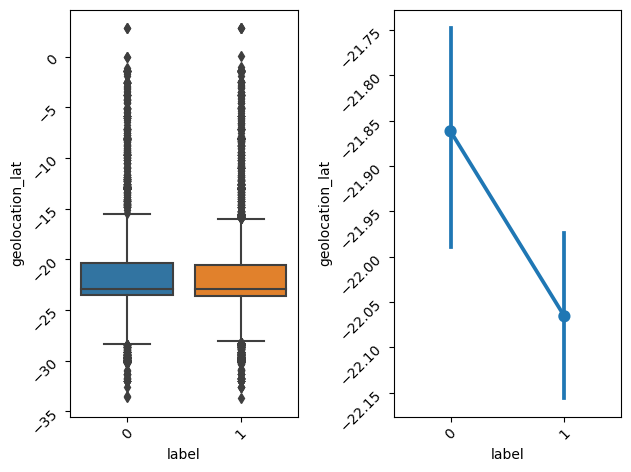

Confidence interval 95% untuk fitur geolocation_lat pada customer yang memberikan rating 5 adalah (-22.156020606775886, -21.975415644287356)
Confidence interval 95% untuk fitur geolocation_lat pada customer yang memberikan rating dibawah 5 adalah  (-21.977704733902, -21.745689509396833)
Reject null hypothesis, H(1): mean variabel numerik customer yang memberikan rating 5  ≠ mean variabel numerik kelompok customer yang memberikan rating dibawah 5 
**************************************************
2


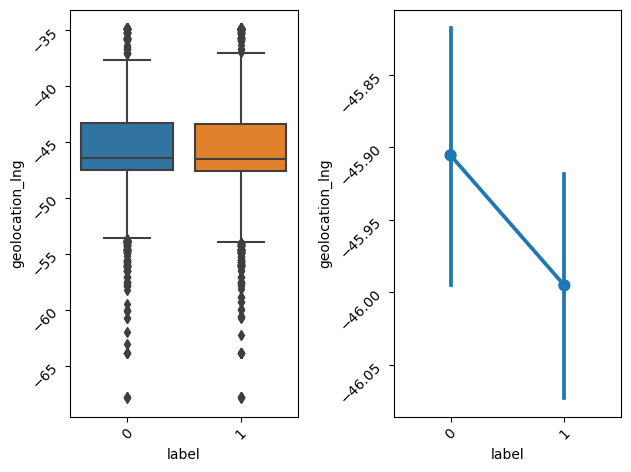

Confidence interval 95% untuk fitur geolocation_lng pada customer yang memberikan rating 5 adalah (-46.07205451931412, -45.918299239147686)
Confidence interval 95% untuk fitur geolocation_lng pada customer yang memberikan rating dibawah 5 adalah  (-45.999490848919294, -45.81154170202666)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
3


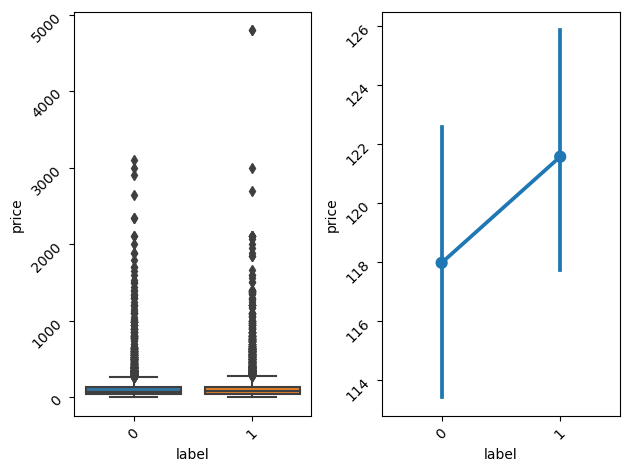

Confidence interval 95% untuk fitur price pada customer yang memberikan rating 5 adalah (117.44192512479022, 125.66880830079792)
Confidence interval 95% untuk fitur price pada customer yang memberikan rating dibawah 5 adalah  (113.34125387271044, 122.57495048122217)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
4


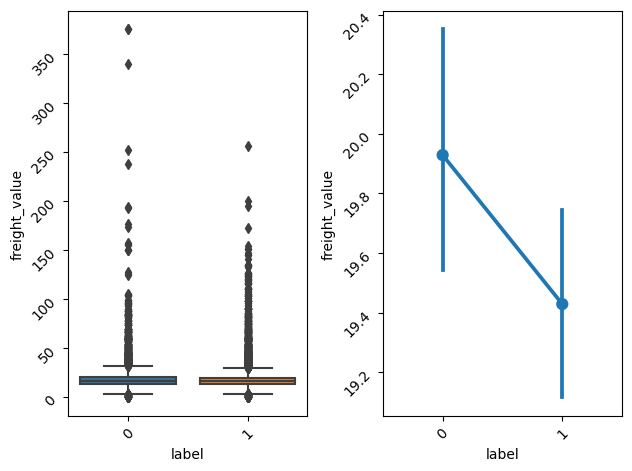

Confidence interval 95% untuk fitur freight_value pada customer yang memberikan rating 5 adalah (19.108555044244415, 19.748730148861636)
Confidence interval 95% untuk fitur freight_value pada customer yang memberikan rating dibawah 5 adalah  (19.50336276651528, 20.354144255956626)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
5


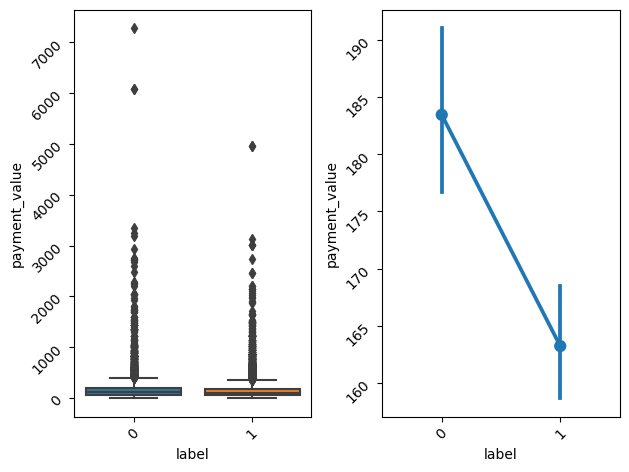

Confidence interval 95% untuk fitur payment_value pada customer yang memberikan rating 5 adalah (158.28195891691556, 168.13376129946388)
Confidence interval 95% untuk fitur payment_value pada customer yang memberikan rating dibawah 5 adalah  (176.086292219663, 190.83240137120623)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
6


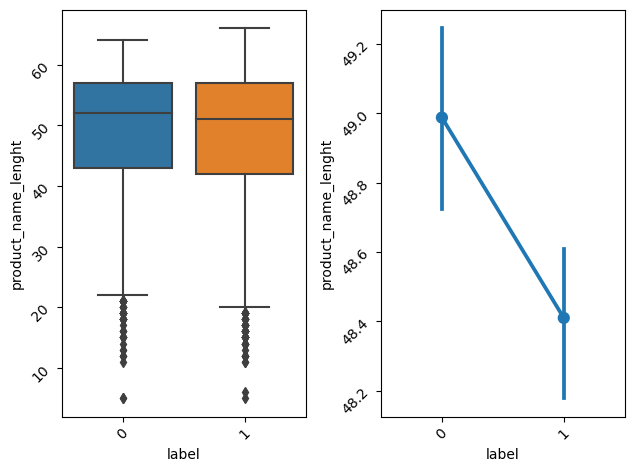

Confidence interval 95% untuk fitur product_name_lenght pada customer yang memberikan rating 5 adalah (48.186713118000874, 48.63275433008169)
Confidence interval 95% untuk fitur product_name_lenght pada customer yang memberikan rating dibawah 5 adalah  (48.73044744593001, 49.24421351052966)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
7


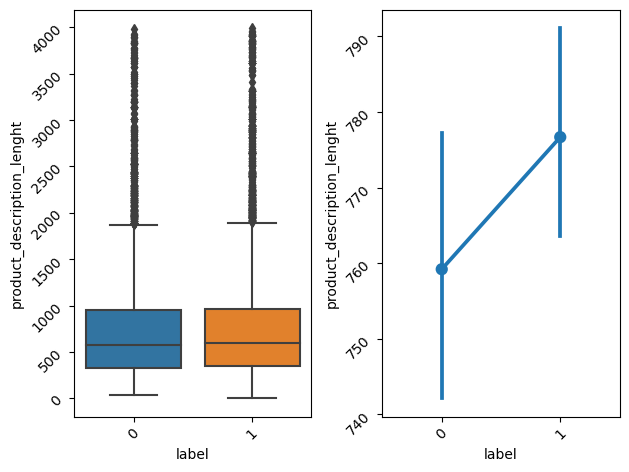

Confidence interval 95% untuk fitur product_description_lenght pada customer yang memberikan rating 5 adalah (762.5461667062568, 790.788270801706)
Confidence interval 95% untuk fitur product_description_lenght pada customer yang memberikan rating dibawah 5 adalah  (742.8797930295354, 775.5263454429842)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
8


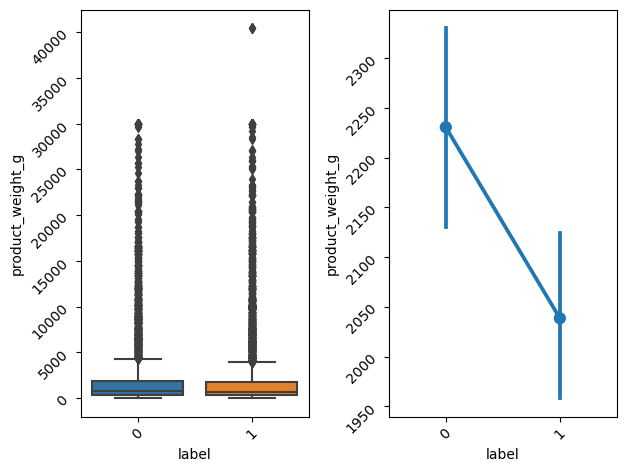

Confidence interval 95% untuk fitur product_weight_g pada customer yang memberikan rating 5 adalah (1957.7417238247351, 2119.51482199601)
Confidence interval 95% untuk fitur product_weight_g pada customer yang memberikan rating dibawah 5 adalah  (2129.4264677455553, 2331.9987429286016)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
9


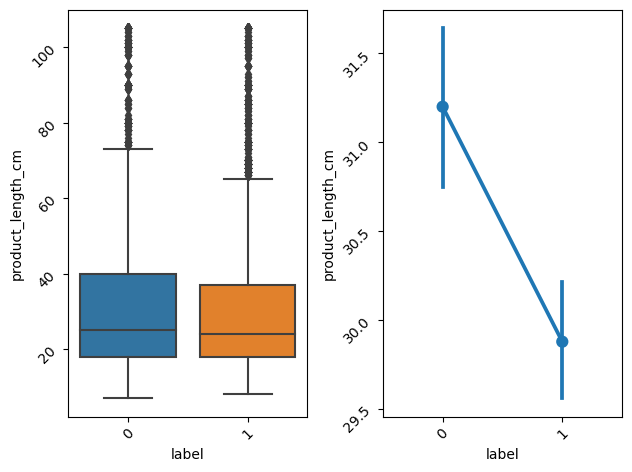

Confidence interval 95% untuk fitur product_length_cm pada customer yang memberikan rating 5 adalah (29.528531075920938, 30.226755933142506)
Confidence interval 95% untuk fitur product_length_cm pada customer yang memberikan rating dibawah 5 adalah  (30.755440119513842, 31.64308516138503)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
10


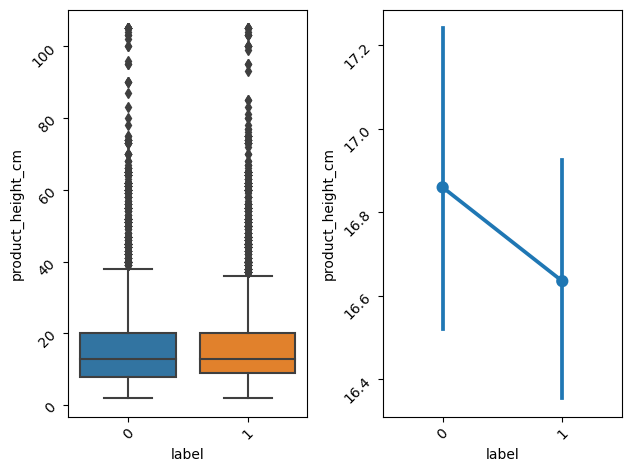

Confidence interval 95% untuk fitur product_height_cm pada customer yang memberikan rating 5 adalah (16.34472278141861, 16.925669967826103)
Confidence interval 95% untuk fitur product_height_cm pada customer yang memberikan rating dibawah 5 adalah  (16.4923251097931, 17.227127137397915)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
11


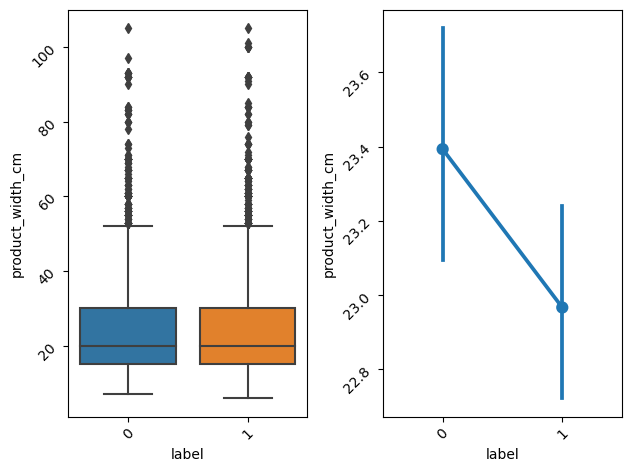

Confidence interval 95% untuk fitur product_width_cm pada customer yang memberikan rating 5 adalah (22.712393127691293, 23.221393377847477)
Confidence interval 95% untuk fitur product_width_cm pada customer yang memberikan rating dibawah 5 adalah  (23.082564509063054, 23.703952344869528)
Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 
**************************************************
12


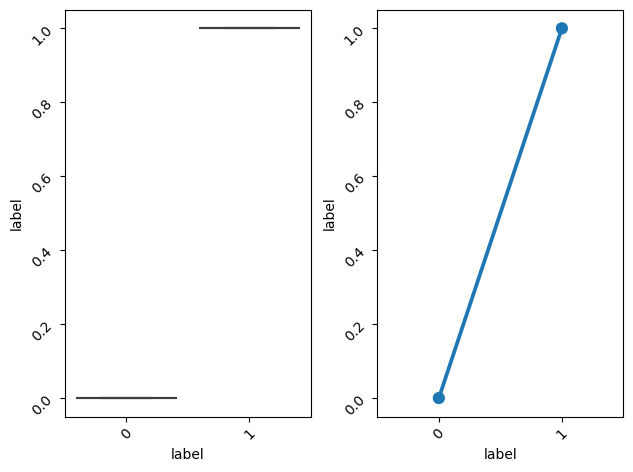

Confidence interval 95% untuk fitur label pada customer yang memberikan rating 5 adalah (nan, nan)
Confidence interval 95% untuk fitur label pada customer yang memberikan rating dibawah 5 adalah  (nan, nan)
Reject null hypothesis, H(1): mean variabel numerik customer yang memberikan rating 5  ≠ mean variabel numerik kelompok customer yang memberikan rating dibawah 5 
**************************************************


In [18]:
n_nonfive = len(md[md['label'] ==0])
n_five = len(md[md['label'] ==1])
number = 1
for col in md_num.columns:
    print(number)
    fig, ax = plt.subplots(1,2)
    
    # buat boxplot
    sns.boxplot(data = md, x='label', y=col, ax=ax[0])
    
    # buat pointplot
    sns.pointplot(data = md, x='label', y=col, ax=ax[1])
    
    plt.tight_layout()
    ax[0].tick_params(rotation=45)
    ax[1].tick_params(rotation=45)
    plt.show()
    
    # confidence interval attrited employee

    ci1 = t.interval(alpha = 0.95,
                    df = len(md[md['label'] ==1]) - 1,
                    loc = md[md['label'] ==1][col].mean(), 
                    scale = md[md['label'] ==1][col].std()/(n_five**(1/2)))
    
    print('Confidence interval 95% untuk fitur {} pada customer yang memberikan rating 5 adalah {}'.format(col, ci1))
    
    # confidence interval non-attrited employee
    
    ci2 = t.interval(alpha = 0.95,
                    df = len(md[md['label'] ==0]) - 1,
                    loc = md[md['label'] ==0][col].mean(), 
                    scale = md[md['label'] ==0][col].std()/(n_nonfive**(1/2)))
    
    print('Confidence interval 95% untuk fitur {} pada customer yang memberikan rating dibawah 5 adalah  {}'.format(col, ci2))
    
    # ind ttest
    
    stat, pvalue = ttest_ind(md[md['label'] ==1][col],
                             md[md['label'] ==0][col])
    
    if pvalue < 0.05:
        print('Reject null hypothesis, H(1): mean variabel numerik customer yang memberikan rating 5  ≠ mean variabel numerik kelompok customer yang memberikan rating dibawah 5 ')
    else:
        print('Fail to reject null hypothesis, maka H(0): mean variabel numerik customer yang memberikan rating 5 = mean variabel numerik customer yang memberikan rating dibawah 5 ')
    print('*'*50)
    number += 1
    

customer_state


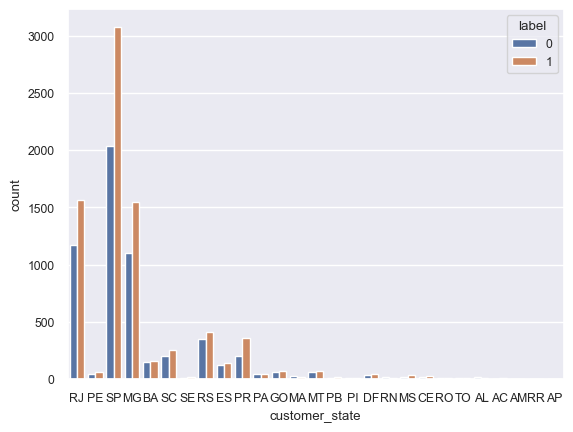

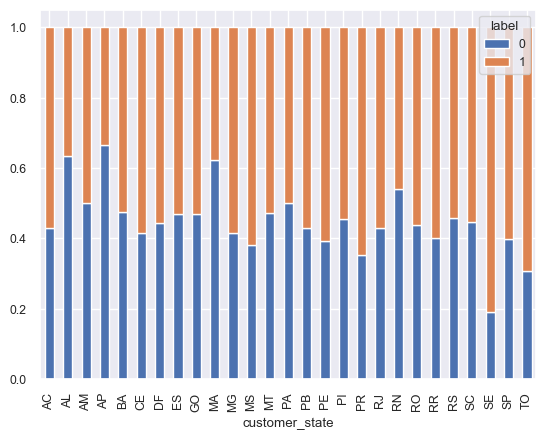

geolocation_state


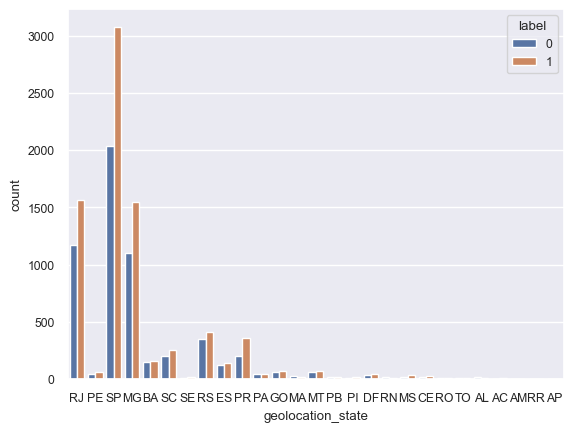

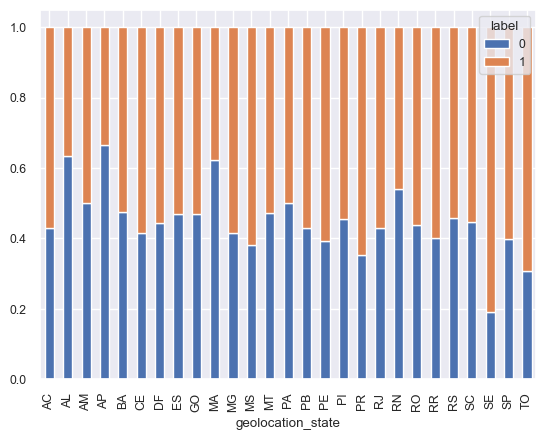

payment_type


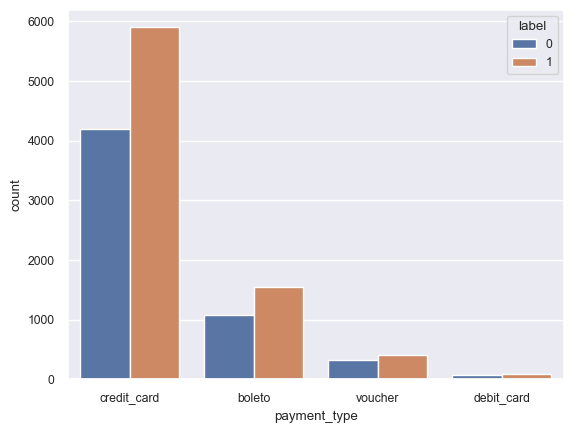

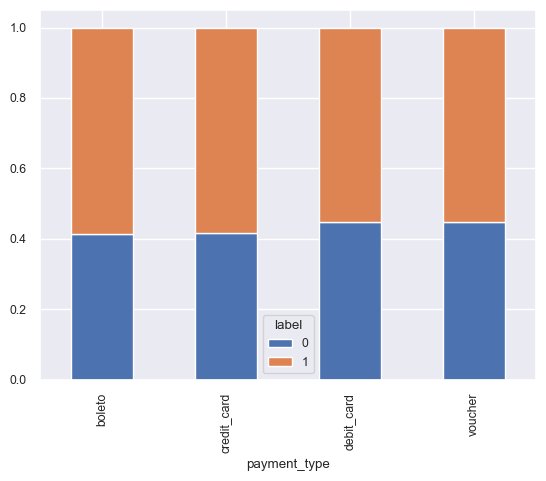

product_category_name


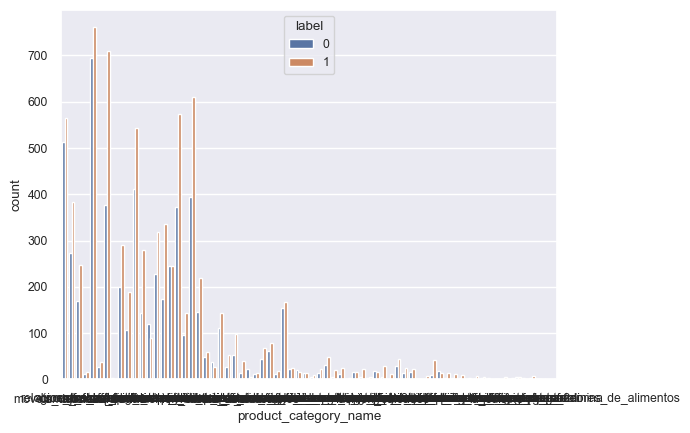

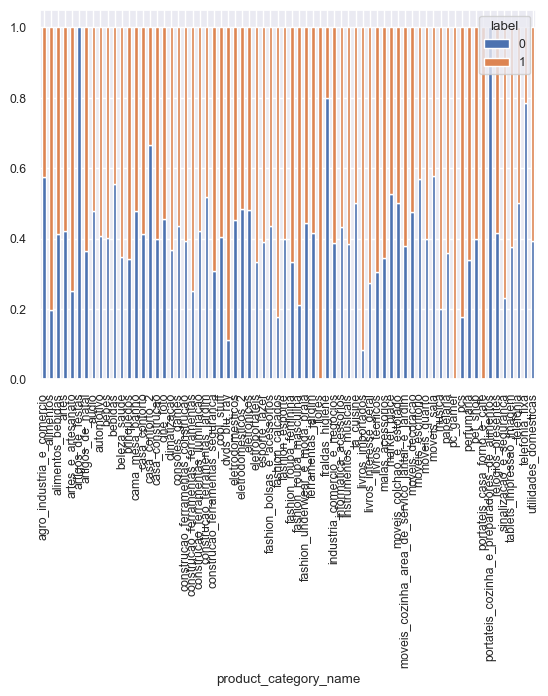

seller_state


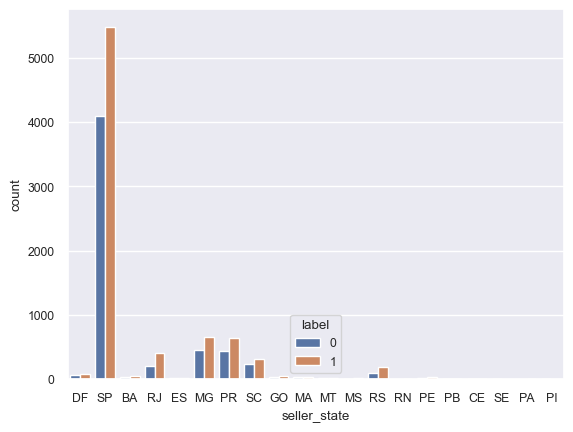

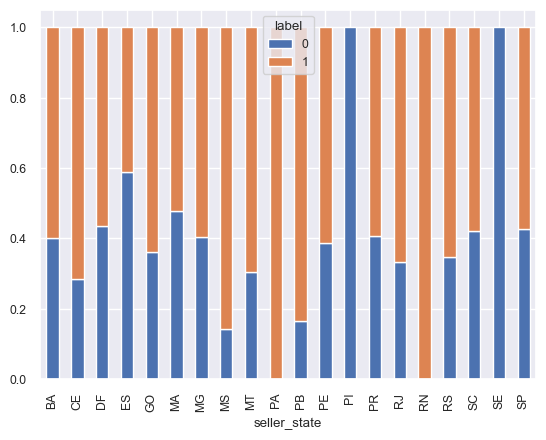

product_category_name_english


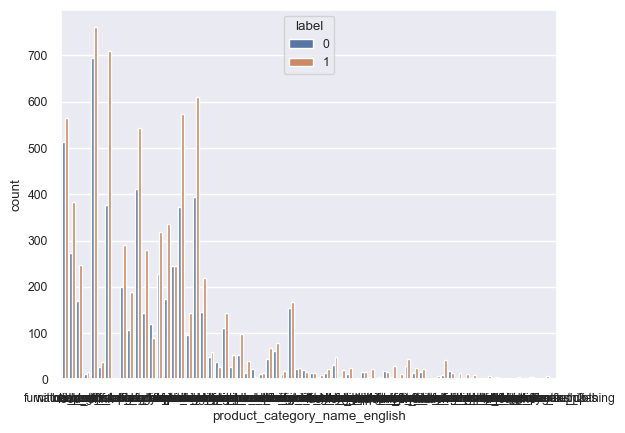

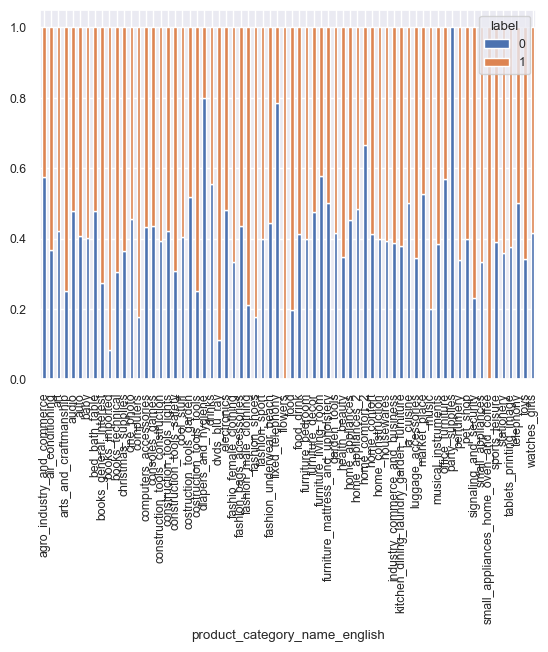

order_item_id


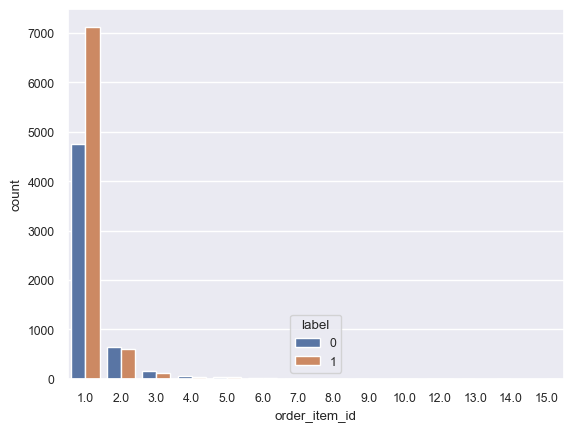

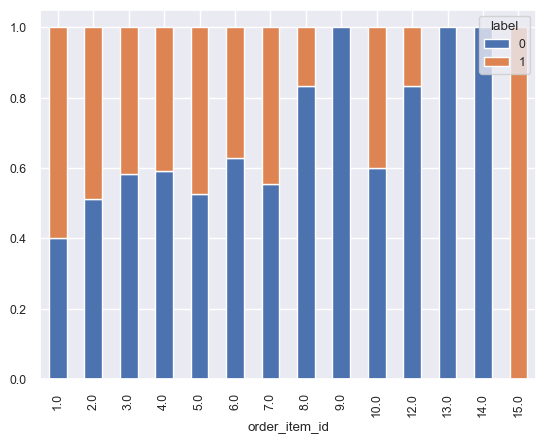

payment_sequential


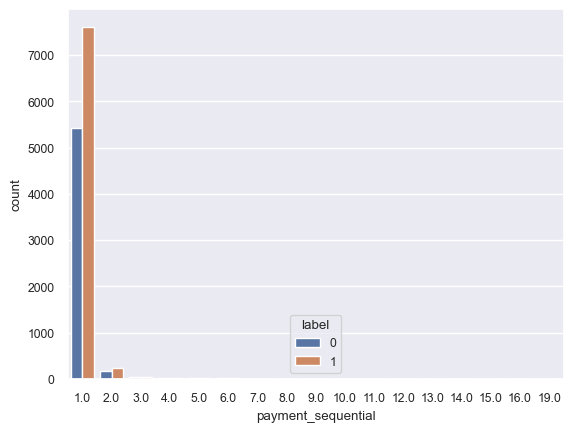

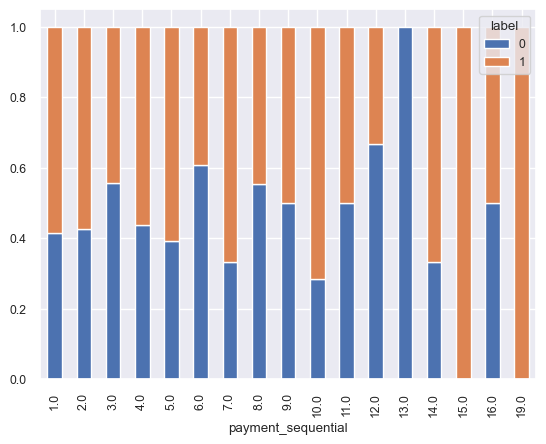

payment_installments


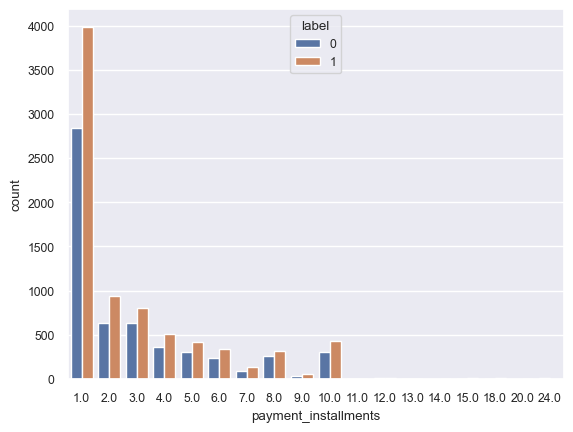

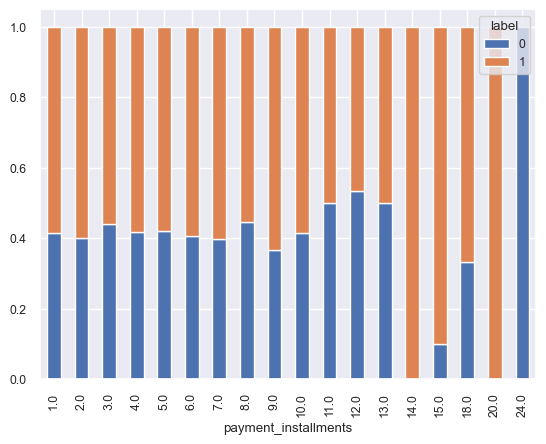

product_photos_qty


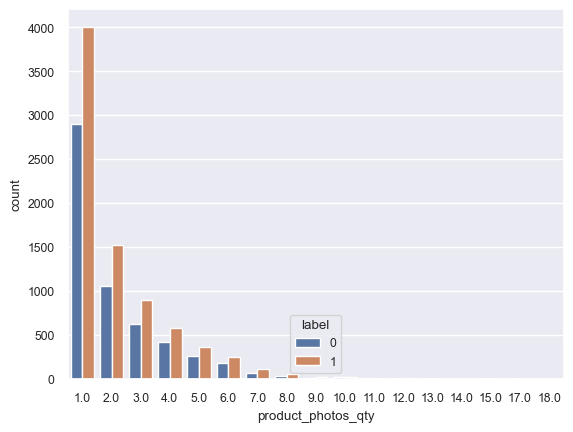

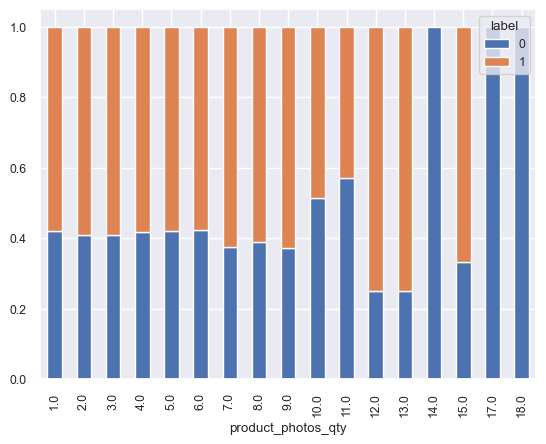

In [19]:
for col in md_cat_all.columns:
    #buat countplot dengan hue
    if col != 'label':
        print(col)
        sns.set(font_scale=0.8)
        sns.countplot(data = md, x=col, hue='label')
        plt.show()

        #buat stacked barplot
        ct = pd.crosstab(index = md[col], columns = md['label'], normalize='index')
        ct.plot(kind='bar', stacked=True)
        plt.show()

# Data Preparation

In [20]:
# Splitting
X = md.drop(['label'], axis=1)
y = md['label']

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=1)

In [22]:
for data in X_train, X_test, y_train ,y_test:
    data.reset_index(drop=True, inplace=True)

In [23]:
#Memastikan y_train dan y_test memiliki ratio yang sama
y_train.value_counts(normalize=True)

1    0.582539
0    0.417461
Name: label, dtype: float64

In [24]:
#Memastikan y_train dan y_test memiliki ratio yang sama
y_test.value_counts(normalize=True)

1    0.582631
0    0.417369
Name: label, dtype: float64

## Missing Value 

### Training Set Missing Value

In [25]:
X_train.isna().sum()/len(X_train)*100

customer_state                   0.000000
geolocation_lat                  0.000000
geolocation_lng                  0.000000
geolocation_state                0.000000
order_purchase_timestamp         0.000000
order_approved_at                0.027483
order_delivered_carrier_date     0.000000
order_delivered_customer_date    0.000000
order_estimated_delivery_date    0.000000
order_item_id                    0.000000
shipping_limit_date              0.000000
price                            0.000000
freight_value                    0.000000
payment_sequential               0.009161
payment_type                     0.009161
payment_installments             0.009161
payment_value                    0.009161
product_category_name            1.410773
product_name_lenght              1.410773
product_description_lenght       1.410773
product_photos_qty               1.410773
product_weight_g                 0.036643
product_length_cm                0.036643
product_height_cm                0

In [26]:
median_imputer = SimpleImputer(strategy='median')
mode_imputer = SimpleImputer(strategy='most_frequent')

In [27]:
# Fitting for model_development
X_train['payment_value'] = median_imputer.fit_transform(X_train[['payment_value']])
X_train['product_name_lenght'] = median_imputer.fit_transform(X_train[['product_name_lenght']])
X_train['product_description_lenght'] = median_imputer.fit_transform(X_train[['product_description_lenght']])
X_train['product_weight_g'] = median_imputer.fit_transform(X_train[['product_weight_g']])
X_train['product_length_cm'] = median_imputer.fit_transform(X_train[['product_length_cm']]) 
X_train['product_height_cm'] = median_imputer.fit_transform(X_train[['product_height_cm']])
X_train['product_width_cm'] = median_imputer.fit_transform(X_train[['product_width_cm']])
X_train['product_photos_qty'] = median_imputer.fit_transform(X_train[['product_photos_qty']])
X_train['payment_sequential'] = mode_imputer.fit_transform(X_train[['payment_sequential']])
X_train['payment_type'] = mode_imputer.fit_transform(X_train[['payment_type']])
X_train['payment_installments'] = mode_imputer.fit_transform(X_train[['payment_installments']])
X_train['product_category_name'] = mode_imputer.fit_transform(X_train[['product_category_name']])
X_train['product_category_name_english'] = mode_imputer.fit_transform(X_train[['product_category_name_english']]) 
X_train['order_approved_at'] = mode_imputer.fit_transform(X_train[['order_approved_at']])
# Fitting for backtesting_model
X_train['geolocation_lat'] = median_imputer.fit_transform(X_train[['geolocation_lat']])
X_train['geolocation_lng'] = median_imputer.fit_transform(X_train[['geolocation_lng']])
X_train['geolocation_state'] = mode_imputer.fit_transform(X_train[['geolocation_state']])
X_train['order_delivered_customer_date'] = mode_imputer.fit_transform(X_train[['order_delivered_customer_date']])

In [28]:
X_train.isna().sum()

customer_state                   0
geolocation_lat                  0
geolocation_lng                  0
geolocation_state                0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
product_category_name            0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
seller_state                     0
product_category_name_english    0
dtype: int64

In [29]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10916 entries, 0 to 10915
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_state                 10916 non-null  object 
 1   geolocation_lat                10916 non-null  float64
 2   geolocation_lng                10916 non-null  float64
 3   geolocation_state              10916 non-null  object 
 4   order_purchase_timestamp       10916 non-null  object 
 5   order_approved_at              10916 non-null  object 
 6   order_delivered_carrier_date   10916 non-null  object 
 7   order_delivered_customer_date  10916 non-null  object 
 8   order_estimated_delivery_date  10916 non-null  object 
 9   order_item_id                  10916 non-null  float64
 10  shipping_limit_date            10916 non-null  object 
 11  price                          10916 non-null  float64
 12  freight_value                  10916 non-null 

### Testing Set Missing Value

In [30]:
X_test.isna().sum()

customer_state                    0
geolocation_lat                   0
geolocation_lng                   0
geolocation_state                 0
order_purchase_timestamp          0
order_approved_at                 0
order_delivered_carrier_date      0
order_delivered_customer_date     0
order_estimated_delivery_date     0
order_item_id                     0
shipping_limit_date               0
price                             0
freight_value                     0
payment_sequential                0
payment_type                      0
payment_installments              0
payment_value                     0
product_category_name            38
product_name_lenght              38
product_description_lenght       38
product_photos_qty               38
product_weight_g                  1
product_length_cm                 1
product_height_cm                 1
product_width_cm                  1
seller_state                      0
product_category_name_english    40
dtype: int64

In [31]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2729 entries, 0 to 2728
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer_state                 2729 non-null   object 
 1   geolocation_lat                2729 non-null   float64
 2   geolocation_lng                2729 non-null   float64
 3   geolocation_state              2729 non-null   object 
 4   order_purchase_timestamp       2729 non-null   object 
 5   order_approved_at              2729 non-null   object 
 6   order_delivered_carrier_date   2729 non-null   object 
 7   order_delivered_customer_date  2729 non-null   object 
 8   order_estimated_delivery_date  2729 non-null   object 
 9   order_item_id                  2729 non-null   float64
 10  shipping_limit_date            2729 non-null   object 
 11  price                          2729 non-null   float64
 12  freight_value                  2729 non-null   f

In [32]:
X_test['product_name_lenght'] = median_imputer.transform(X_test[['product_name_lenght']])
X_test['product_description_lenght'] = median_imputer.transform(X_test[['product_description_lenght']])
X_test['product_weight_g'] = median_imputer.transform(X_test[['product_weight_g']])
X_test['product_length_cm'] = median_imputer.transform(X_test[['product_length_cm']]) 
X_test['product_height_cm'] = median_imputer.transform(X_test[['product_height_cm']])
X_test['product_width_cm'] = median_imputer.transform(X_test[['product_width_cm']])       
X_test['product_photos_qty'] = median_imputer.transform(X_test[['product_photos_qty']])
X_test['product_category_name'] = mode_imputer.transform(X_test[['product_category_name']])
X_test['product_category_name_english'] = mode_imputer.transform(X_test[['product_category_name_english']]) 

In [33]:
X_test.isna().sum()

customer_state                   0
geolocation_lat                  0
geolocation_lng                  0
geolocation_state                0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
product_category_name            0
product_name_lenght              0
product_description_lenght       0
product_photos_qty               0
product_weight_g                 0
product_length_cm                0
product_height_cm                0
product_width_cm                 0
seller_state                     0
product_category_name_english    0
dtype: int64

In [34]:
data_date=['order_purchase_timestamp','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date','shipping_limit_date']
X_train[data_date]=X_train[data_date].apply(lambda x: pd.to_datetime(x,errors = 'coerce', format = '%Y-%m-%d %H:%M:%S'))
X_test[data_date]=X_test[data_date].apply(lambda x: pd.to_datetime(x,errors = 'coerce', format = '%Y-%m-%d %H:%M:%S'))

In [35]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2729 entries, 0 to 2728
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_state                 2729 non-null   object        
 1   geolocation_lat                2729 non-null   float64       
 2   geolocation_lng                2729 non-null   float64       
 3   geolocation_state              2729 non-null   object        
 4   order_purchase_timestamp       2729 non-null   datetime64[ns]
 5   order_approved_at              2729 non-null   datetime64[ns]
 6   order_delivered_carrier_date   2729 non-null   datetime64[ns]
 7   order_delivered_customer_date  2729 non-null   datetime64[ns]
 8   order_estimated_delivery_date  2729 non-null   datetime64[ns]
 9   order_item_id                  2729 non-null   float64       
 10  shipping_limit_date            2729 non-null   datetime64[ns]
 11  price            

# Feature Engineering

## Feature Transformation

### Training Set

In [36]:
#Pseudo numerik
pseudo_num = ['order_item_id', 'payment_sequential', 'payment_installments','product_photos_qty']
number = list(X_train.select_dtypes('number').columns)
for x in pseudo_num:
    number.remove(x)

In [37]:
cat=X_train.select_dtypes('object').columns

In [38]:
X_train_num = X_train[number]
minmax = MinMaxScaler()
X_train_scl = pd.DataFrame(minmax.fit_transform(X_train_num), columns=number)

In [39]:
X_train_cat = X_train[cat]
ohe = OneHotEncoder(handle_unknown='ignore')
X_train_ohe = pd.DataFrame(ohe.fit_transform(X_train_cat).toarray(), columns=ohe.get_feature_names_out(cat))

In [40]:
X_train_ps = X_train[pseudo_num]

In [41]:
X_train_date=X_train[data_date]

In [42]:
X_train_transformed = pd.concat([X_train_scl, X_train_ohe, X_train_ps, X_train_date],axis=1)

In [43]:
X_train_date

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,shipping_limit_date
0,2017-08-25 18:09:40,2017-08-25 18:26:14,2017-09-13 19:13:05,2017-09-19 22:05:52,2017-09-29,2017-09-13 18:26:14
1,2018-06-26 20:41:56,2018-06-26 20:55:23,2018-06-27 11:10:00,2018-06-29 19:06:45,2018-07-12,2018-07-02 20:55:23
2,2018-02-18 00:10:50,2018-02-18 00:26:32,2018-02-20 23:25:12,2018-02-27 17:28:30,2018-03-12,2018-02-22 00:26:32
3,2017-11-03 08:43:08,2017-11-03 08:50:24,2017-11-03 19:29:01,2017-11-08 22:20:59,2017-11-28,2017-11-09 08:50:24
4,2018-02-07 14:53:56,2018-02-07 15:11:13,2018-02-15 20:53:20,2018-02-23 00:25:23,2018-03-13,2018-02-13 15:11:13
...,...,...,...,...,...,...
10911,2017-10-16 12:38:07,2017-10-17 04:06:09,2017-10-20 18:57:42,2017-10-27 17:33:49,2017-11-03,2017-10-23 04:06:09
10912,2017-07-03 14:03:34,2017-07-03 14:15:15,2017-07-04 13:37:29,2017-07-11 17:07:42,2017-07-26,2017-07-10 14:15:15
10913,2018-07-19 14:09:38,2018-07-19 14:23:00,2018-07-23 14:11:00,2018-07-26 18:58:41,2018-08-03,2018-07-24 14:23:00
10914,2018-04-28 16:37:31,2018-04-28 16:53:29,2018-04-30 12:42:00,2018-05-04 20:44:30,2018-05-22,2018-05-04 16:53:29


### Feature Synthesis

In [44]:
X_train_transformed['purchase_to_approved']=X_train_transformed['order_approved_at']-X_train_transformed['order_purchase_timestamp']
X_train_transformed['approved_to_delivered_carrier']=X_train_transformed['order_delivered_carrier_date']-X_train_transformed['order_approved_at']
X_train_transformed['delivered_carrier_to_delivered_customer']=X_train_transformed['order_delivered_customer_date']-X_train_transformed['order_delivered_carrier_date']
X_train_transformed['purchase_to_delivered_customer']=X_train_transformed['order_delivered_carrier_date']-X_train_transformed['order_purchase_timestamp']

In [45]:
data_date2=['purchase_to_approved','approved_to_delivered_carrier','delivered_carrier_to_delivered_customer','purchase_to_delivered_customer']

In [46]:
X_train_transformed

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [47]:
X_train_transformed['order_approved_at']-X_train_transformed['order_purchase_timestamp']

0       0 days 00:16:34
1       0 days 00:13:27
2       0 days 00:15:42
3       0 days 00:07:16
4       0 days 00:17:17
              ...      
10911   0 days 15:28:02
10912   0 days 00:11:41
10913   0 days 00:13:22
10914   0 days 00:15:58
10915   0 days 00:21:40
Length: 10916, dtype: timedelta64[ns]

In [48]:
def break_date(x_t,date):
    for i in date:
        s_year='_year'
        s_month='_month'
        s_week='_week'
        s_day='_day'
        s_hour='_hour'
        s_minute='_minute'
        s_dayofweek='_dayofweek'
        
        x_t[i+s_year]=x_t[i].dt.year
        x_t[i+s_month]=x_t[i].dt.month
        x_t[i+s_week]=x_t[i].dt.week
        x_t[i+s_day]=x_t[i].dt.day
        x_t[i+s_hour]=x_t[i].dt.hour
        x_t[i+s_minute]=x_t[i].dt.minute
        x_t[i+s_dayofweek]=x_t[i].dt.dayofweek
        
    return(x_t)

In [49]:
def break_date2(x_t,date):
    for i in date:
        s_day='_days'
        s_seconds='_seconds'

        x_t[i+s_day]=x_t[i].dt.days
        x_t[i+s_seconds]=x_t[i].dt.seconds
        
    return(x_t)

In [50]:
break_date(X_train_transformed,data_date)

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [51]:
break_date2(X_train_transformed,data_date2)

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [52]:
X_train_transformed=X_train_transformed.drop(data_date,axis=1)

In [53]:
X_train_transformed=X_train_transformed.drop(data_date2,axis=1)

In [54]:
X_train_transformed

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [55]:
X_train_ps.isna().sum()

order_item_id           0
payment_sequential      0
payment_installments    0
product_photos_qty      0
dtype: int64

In [56]:
X_train_transformed.isna().sum()

geolocation_lat                                    0
geolocation_lng                                    0
price                                              0
freight_value                                      0
payment_value                                      0
                                                  ..
approved_to_delivered_carrier_seconds              0
delivered_carrier_to_delivered_customer_days       0
delivered_carrier_to_delivered_customer_seconds    0
purchase_to_delivered_customer_days                0
purchase_to_delivered_customer_seconds             0
Length: 278, dtype: int64

In [57]:
X_train_transformed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10916 entries, 0 to 10915
Columns: 278 entries, geolocation_lat to purchase_to_delivered_customer_seconds
dtypes: float64(228), int64(50)
memory usage: 23.2 MB


### Testing set

In [58]:
X_test_num = X_test[number]
X_test_scl = pd.DataFrame(minmax.transform(X_test_num), columns=number)

X_test_cat = X_test[cat]
X_test_ohe = pd.DataFrame(ohe.transform(X_test_cat).toarray(), columns=ohe.get_feature_names_out(cat))

X_test_ps = X_test[pseudo_num]

X_test_date=X_test[data_date]

X_test_transformed = pd.concat([X_test_scl, X_test_ohe, X_test_ps, X_test_date],axis=1)

In [59]:
X_test_transformed.isna().sum()

geolocation_lat                  0
geolocation_lng                  0
price                            0
freight_value                    0
payment_value                    0
                                ..
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
shipping_limit_date              0
Length: 234, dtype: int64

In [60]:
X_test_transformed['purchase_to_approved']=X_test_transformed['order_approved_at']-X_test_transformed['order_purchase_timestamp']
X_test_transformed['approved_to_delivered_carrier']=X_test_transformed['order_delivered_carrier_date']-X_test_transformed['order_approved_at']
X_test_transformed['delivered_carrier_to_delivered_customer']=X_test_transformed['order_delivered_customer_date']-X_test_transformed['order_delivered_carrier_date']
X_test_transformed['purchase_to_delivered_customer']=X_test_transformed['order_delivered_carrier_date']-X_test_transformed['order_purchase_timestamp']

In [61]:
X_test_transformed

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [62]:
break_date(X_test_transformed,data_date)

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [63]:
break_date2(X_test_transformed,data_date2)

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [64]:
X_test_transformed=X_test_transformed.drop(data_date,axis=1)

In [65]:
X_test_transformed=X_test_transformed.drop(data_date2,axis=1)

In [66]:
X_test_transformed

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

## Feature Selection

In [67]:
feature_comb = list(itertools.combinations(X_train_transformed.columns, 2))
feature_comb

[('geolocation_lat', 'geolocation_lng'),
 ('geolocation_lat', 'price'),
 ('geolocation_lat', 'freight_value'),
 ('geolocation_lat', 'payment_value'),
 ('geolocation_lat', 'product_name_lenght'),
 ('geolocation_lat', 'product_description_lenght'),
 ('geolocation_lat', 'product_weight_g'),
 ('geolocation_lat', 'product_length_cm'),
 ('geolocation_lat', 'product_height_cm'),
 ('geolocation_lat', 'product_width_cm'),
 ('geolocation_lat', 'customer_state_AC'),
 ('geolocation_lat', 'customer_state_AL'),
 ('geolocation_lat', 'customer_state_AM'),
 ('geolocation_lat', 'customer_state_AP'),
 ('geolocation_lat', 'customer_state_BA'),
 ('geolocation_lat', 'customer_state_CE'),
 ('geolocation_lat', 'customer_state_DF'),
 ('geolocation_lat', 'customer_state_ES'),
 ('geolocation_lat', 'customer_state_GO'),
 ('geolocation_lat', 'customer_state_MA'),
 ('geolocation_lat', 'customer_state_MG'),
 ('geolocation_lat', 'customer_state_MS'),
 ('geolocation_lat', 'customer_state_MT'),
 ('geolocation_lat', 'cu

In [68]:
drop_feature_comb = []
for a, b in feature_comb:
    coef, pvalue = spearmanr(X_train_transformed[a], X_train_transformed[b])
    if pvalue < 0.05:
        if coef > 0.95:
            drop_feature_comb.append(b)
        elif coef < -0.95:
            drop_feature_comb.append(b)
drop_feature_comb

['geolocation_state_AC',
 'geolocation_state_AL',
 'geolocation_state_AM',
 'geolocation_state_AP',
 'geolocation_state_BA',
 'geolocation_state_CE',
 'geolocation_state_DF',
 'geolocation_state_ES',
 'geolocation_state_GO',
 'geolocation_state_MA',
 'geolocation_state_MG',
 'geolocation_state_MS',
 'geolocation_state_MT',
 'geolocation_state_PA',
 'geolocation_state_PB',
 'geolocation_state_PE',
 'geolocation_state_PI',
 'geolocation_state_PR',
 'geolocation_state_RJ',
 'geolocation_state_RN',
 'geolocation_state_RO',
 'geolocation_state_RR',
 'geolocation_state_RS',
 'geolocation_state_SC',
 'geolocation_state_SE',
 'geolocation_state_SP',
 'geolocation_state_TO',
 'product_category_name_english_agro_industry_and_commerce',
 'product_category_name_english_food',
 'product_category_name_english_food_drink',
 'product_category_name_english_art',
 'product_category_name_english_arts_and_craftmanship',
 'product_category_name_english_party_supplies',
 'product_category_name_english_chris

In [69]:
# Drop kolom x train yang telah difilter pada multikolinearitas
X_train_sel = X_train_transformed.drop(drop_feature_comb, axis=1)
X_test_sel = X_test_transformed.drop(drop_feature_comb, axis=1)

In [70]:
mi = mutual_info_classif(X_train_sel, y_train, random_state=1)
mi_tabel =pd.DataFrame({'features': X_train_sel.columns, 'mi': mi}).sort_values('mi', ascending=False)
mi_tabel

,features,mi
168,purchase_to_delivered_customer_seconds,0.055347
166,delivered_carrier_to_delivered_customer_seconds,0.048189
164,approved_to_delivered_carrier_seconds,0.047940
162,purchase_to_approved_seconds,0.043337
4,payment_value,0.035463
...,...,...
107,product_category_name_telefonia,0.000000
106,product_category_name_tablets_impressao_imagem,0.000000
105,product_category_name_sinalizacao_e_seguranca,0.000000
104,product_category_name_relogios_presentes,0.000000


In [71]:
mi_under = mi_tabel[mi_tabel['mi']<0.00001]
mi_drop= list(mi_under['features'])

In [72]:
mi_drop

['order_purchase_timestamp_dayofweek',
 'product_category_name_artes',
 'order_purchase_timestamp_minute',
 'product_category_name_artes_e_artesanato',
 'customer_state_ES',
 'order_approved_at_day',
 'order_approved_at_hour',
 'product_category_name_automotivo',
 'payment_sequential',
 'order_approved_at_dayofweek',
 'product_category_name_artigos_de_natal',
 'product_category_name_fashion_esporte',
 'customer_state_DF',
 'order_estimated_delivery_date_dayofweek',
 'payment_type_credit_card',
 'product_name_lenght',
 'product_length_cm',
 'product_height_cm',
 'payment_type_debit_card',
 'product_width_cm',
 'product_category_name_agro_industria_e_comercio',
 'shipping_limit_date_day',
 'customer_state_SE',
 'order_delivered_carrier_date_minute',
 'order_estimated_delivery_date_hour',
 'customer_state_AM',
 'customer_state_AP',
 'order_estimated_delivery_date_year',
 'product_category_name_alimentos_bebidas',
 'customer_state_MA',
 'order_delivered_customer_date_month',
 'order_delive

In [73]:
#Drop kolom x train yang telah difilter pada multikolinearitas
X_train_sel2 = X_train_sel.drop(mi_drop, axis=1)
X_test_sel2 = X_test_sel.drop(mi_drop, axis=1)

In [74]:
X_train_sel2

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_description_lenght,product_weight_g,customer_state_AC,customer_state_AL,customer_state_BA,customer_state_CE,customer_state_MS,customer_state_MT,customer_state_PB,customer_state_RO,customer_state_SC,customer_state_SP,customer_state_TO,payment_type_boleto,payment_type_voucher,product_category_name_alimentos,product_category_name_artigos_de_festas,product_category_name_audio,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_calcados,product_category_name_fashion_roupa_feminina,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_tecnicos,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_escritorio,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_telefonia_fixa,seller_state_BA,seller_state_CE,seller_state_GO,seller_state_MA,seller_state_MG,seller_state_MS,seller_state_MT,seller_state_RJ,seller_state_SP,order_item_id,payment_installments,product_photos_qty,order_purchase_timestamp_year,order_purchase_timestamp_month,order_purchase_timestamp_day,order_purchase_timestamp_hour,order_approved_at_minute,order_delivered_carrier_date_day,order_delivered_carrier_date_hour,order_delivered_customer_date_day,order_delivered_customer_date_hour,order_delivered_customer_date_minute,order_delivered_customer_date_dayofweek,order_estimated_delivery_date_month,order_estimated_delivery_date_day,order_estimated_delivery_date_minute,shipping_limit_date_minute,shipping_limit_date_dayofweek,purchase_to_approved_days,purchase_to_approved_seconds,approved_to_delivered_carrier_days,approved_to_delivered_carrier_seconds,delivered_carrier_to_delivered_customer_days,delivered_carrier_to_delivered_customer_seconds,purchase_to_delivered_customer_days,purchase_to_delivered_customer_seconds
0,0.294407,0.741467,0.002647,0.037572,0.002257,0.151972,0.004898,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,2017,8,25,18,26,13,19,19,22,5,1,9,29,0,26,2,0,994,19,2811,6,10367,19,3805
1,0.276614,0.639897,0.037142,0.022703,0.025830,0.465210,0.009425,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0,4.0,2018,6,26,20,55,27,11,29,19,6,4,7,12,0,55,0,0,807,0,51277,2,28605,0,52084
2,0.376579,0.724486,0.016422,0.053427,0.013750,0.350666,0.061797,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [75]:
X_test_sel2

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_description_lenght,product_weight_g,customer_state_AC,customer_state_AL,customer_state_BA,customer_state_CE,customer_state_MS,customer_state_MT,customer_state_PB,customer_state_RO,customer_state_SC,customer_state_SP,customer_state_TO,payment_type_boleto,payment_type_voucher,product_category_name_alimentos,product_category_name_artigos_de_festas,product_category_name_audio,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_calcados,product_category_name_fashion_roupa_feminina,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_tecnicos,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_escritorio,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_telefonia_fixa,seller_state_BA,seller_state_CE,seller_state_GO,seller_state_MA,seller_state_MG,seller_state_MS,seller_state_MT,seller_state_RJ,seller_state_SP,order_item_id,payment_installments,product_photos_qty,order_purchase_timestamp_year,order_purchase_timestamp_month,order_purchase_timestamp_day,order_purchase_timestamp_hour,order_approved_at_minute,order_delivered_carrier_date_day,order_delivered_carrier_date_hour,order_delivered_customer_date_day,order_delivered_customer_date_hour,order_delivered_customer_date_minute,order_delivered_customer_date_dayofweek,order_estimated_delivery_date_month,order_estimated_delivery_date_day,order_estimated_delivery_date_minute,shipping_limit_date_minute,shipping_limit_date_dayofweek,purchase_to_approved_days,purchase_to_approved_seconds,approved_to_delivered_carrier_days,approved_to_delivered_carrier_seconds,delivered_carrier_to_delivered_customer_days,delivered_carrier_to_delivered_customer_seconds,purchase_to_delivered_customer_days,purchase_to_delivered_customer_seconds
0,0.355400,0.643646,0.007774,0.044740,0.007599,0.089425,0.006135,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2017,12,6,20,10,7,18,18,15,44,0,1,9,0,10,2,0,23559,0,55699,10,75892,0,79258
1,0.413837,0.646593,0.007879,0.048950,0.007885,0.152223,0.016030,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,4.0,2018,7,3,11,7,4,8,9,23,16,0,7,25,0,32,4,2,16087,-2,59623,5,52549,0,75710
2,0.341828,0.607496,0.025595,0.052867,0.019771,0.197187,0.022215,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.

# Modeling

## Model Selection (Xgboost)
## Tuning Model

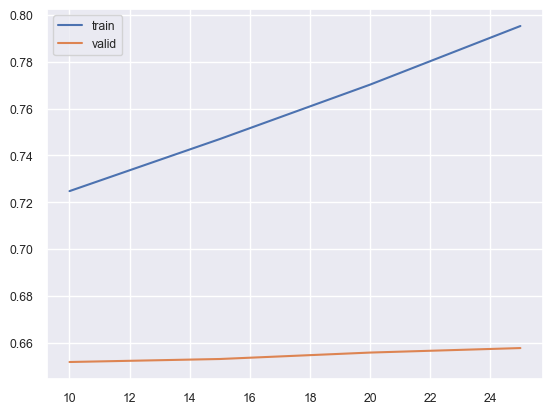

In [76]:
params = np.arange(10, 30, 5)
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=1,
                        n_estimators=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [77]:
params[np.argmax(valid)]

25

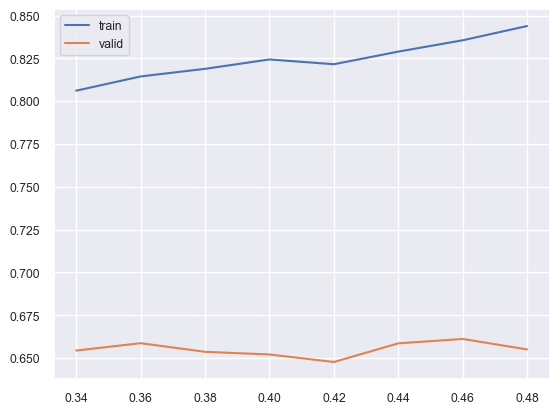

In [78]:
params = [0.34,0.36,0.38,0.40,0.42,0.44,0.46,0.48]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=1,
                        n_estimators=25,
                        learning_rate=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [79]:
params[np.argmax(valid)]

0.46

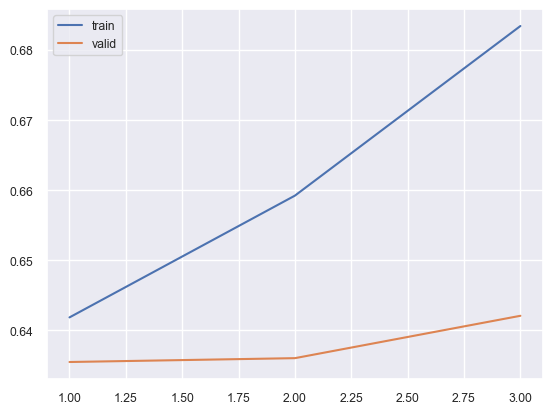

In [80]:
params = [1,2,3]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=1,
                        n_estimators=25,
                        learning_rate=0.46,
                        max_depth=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [81]:
params[np.argmax(valid)]

3

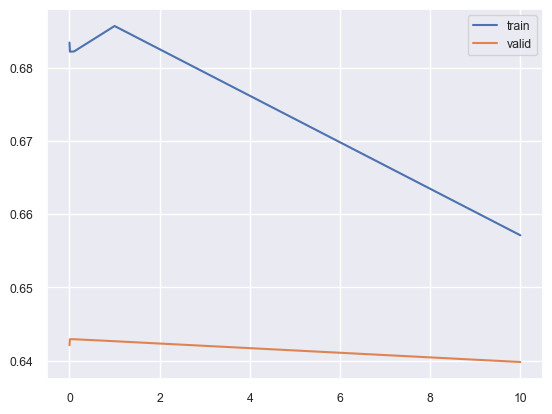

In [82]:
params = [0, 0.01, 0.1, 1, 10]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=1,
                        n_estimators=25,
                        learning_rate=0.46,
                        max_depth=3,
                        gamma=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [83]:
params[np.argmax(valid)]

0.01

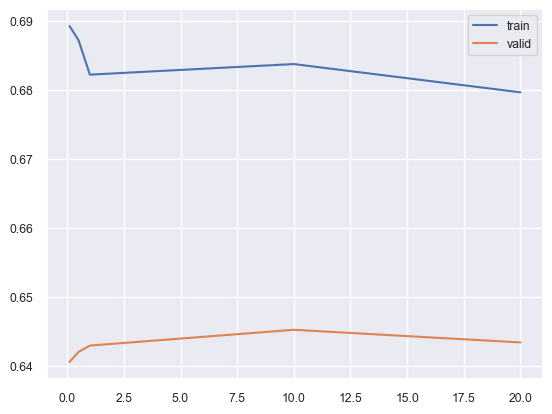

In [84]:
params = [0.1, 0.5, 1, 10, 20]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=1,
                        n_estimators=25,
                        learning_rate=0.46,
                        max_depth=3,
                        gamma=0.01,
                        reg_lambda=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [85]:
params[np.argmax(valid)]

10

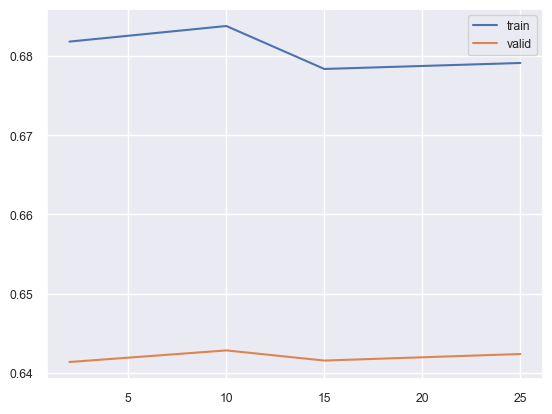

In [86]:
params = [2,10,15,25]
train = []
valid = []

for par in params:
    xgb = XGBClassifier(random_state=1,
                        n_estimators=25,
                        learning_rate=0.46,
                        max_depth=3,
                        gamma=0.01,
                        reg_lambda=10,
                        min_child_weight=par)
    result = cross_validate(xgb, X_train_sel2, y_train, cv=5, return_train_score=True)
    train.append(result['train_score'].mean())
    valid.append(result['test_score'].mean())

sns.lineplot(x = params, y = train, label = 'train')
sns.lineplot( x = params, y = valid, label = 'valid')
plt.show()

In [87]:
params[np.argmax(valid)]

10

In [88]:
xgb_final = XGBClassifier(random_state=1,
                        n_estimators=25,
                        learning_rate=0.46,
                        max_depth=3,
                        gamma=0.01,
                        reg_lambda=10,
                        min_child_weight=10)

In [89]:
xgb_final.fit(X_train_sel2, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0.01, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.46, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=10,
              missing=nan, monotone_constraints='()', n_estimators=25, n_jobs=0,
              num_parallel_tree=1, predictor='auto', random_state=1,
              reg_alpha=0, reg_lambda=10, ...)

In [90]:
classif_lr(X_train_sel2, y_train, xgb_final, 0.6)

              precision    recall  f1-score   support

           1       0.72      0.70      0.71      6359
           0       0.60      0.62      0.61      4557

    accuracy                           0.67     10916
   macro avg       0.66      0.66      0.66     10916
weighted avg       0.67      0.67      0.67     10916



In [91]:
classif_lr(X_test_sel2, y_test, xgb_final, 0.6)

              precision    recall  f1-score   support

           1       0.69      0.66      0.68      1590
           0       0.56      0.59      0.57      1139

    accuracy                           0.63      2729
   macro avg       0.62      0.63      0.62      2729
weighted avg       0.64      0.63      0.63      2729



# Evaluasi

## Backtesting

In [92]:
bt = pd.read_csv('model_backtesting_set.csv')

In [93]:
bt=bt.drop(feature_identitas_status, axis=1)

In [94]:
bt.isna().sum()

customer_state                     0
geolocation_lat                    1
geolocation_lng                    1
geolocation_state                  1
order_purchase_timestamp           0
order_approved_at                  1
order_delivered_carrier_date       0
order_delivered_customer_date      1
order_estimated_delivery_date      0
order_item_id                      0
shipping_limit_date                0
price                              0
freight_value                      0
payment_sequential                 0
payment_type                       0
payment_installments               0
payment_value                      0
product_category_name            108
product_name_lenght              108
product_description_lenght       108
product_photos_qty               108
product_weight_g                   4
product_length_cm                  4
product_height_cm                  4
product_width_cm                   4
seller_state                       0
product_category_name_english    110
d

In [95]:
bt['geolocation_lat'] = median_imputer.transform(bt[['geolocation_lat']])
bt['geolocation_lng'] = median_imputer.transform(bt[['geolocation_lng']])
bt['geolocation_state'] = mode_imputer.transform(bt[['geolocation_state']])
bt['order_approved_at'] = mode_imputer.transform(bt[['order_approved_at']])
bt['order_delivered_customer_date'] = mode_imputer.transform(bt[['order_delivered_customer_date']])
bt['product_category_name'] = mode_imputer.transform(bt[['product_category_name']])
bt['product_name_lenght'] = median_imputer.transform(bt[['product_name_lenght']])
bt['product_description_lenght'] = median_imputer.transform(bt[['product_description_lenght']])
bt['product_photos_qty'] = median_imputer.transform(bt[['product_photos_qty']])
bt['product_weight_g'] = median_imputer.transform(bt[['product_weight_g']])
bt['product_length_cm'] = median_imputer.transform(bt[['product_length_cm']]) 
bt['product_height_cm'] = median_imputer.transform(bt[['product_height_cm']])
bt['product_width_cm'] = median_imputer.transform(bt[['product_width_cm']])       
bt['product_category_name_english'] = mode_imputer.transform(bt[['product_category_name_english']]) 

In [96]:
bt.isna().sum()/len(bt)

customer_state                   0.0
geolocation_lat                  0.0
geolocation_lng                  0.0
geolocation_state                0.0
order_purchase_timestamp         0.0
order_approved_at                0.0
order_delivered_carrier_date     0.0
order_delivered_customer_date    0.0
order_estimated_delivery_date    0.0
order_item_id                    0.0
shipping_limit_date              0.0
price                            0.0
freight_value                    0.0
payment_sequential               0.0
payment_type                     0.0
payment_installments             0.0
payment_value                    0.0
product_category_name            0.0
product_name_lenght              0.0
product_description_lenght       0.0
product_photos_qty               0.0
product_weight_g                 0.0
product_length_cm                0.0
product_height_cm                0.0
product_width_cm                 0.0
seller_state                     0.0
product_category_name_english    0.0
d

In [97]:
bt[data_date]=bt[data_date].apply(lambda x: pd.to_datetime(x,errors = 'coerce', format = '%Y-%m-%d %H:%M:%S'))

In [98]:
bt_num = bt[number]
bt_scl = pd.DataFrame(minmax.transform(bt_num), columns=number)

bt_cat = bt[cat]
bt_ohe = pd.DataFrame(ohe.transform(bt_cat).toarray(), columns=ohe.get_feature_names_out(cat))

bt_ps = bt[pseudo_num]

bt_date=bt[data_date]

bt_transformed = pd.concat([bt_scl, bt_ohe, bt_ps, bt_date],axis=1)

In [99]:
bt_transformed['purchase_to_approved']=bt_transformed['order_approved_at']-bt_transformed['order_purchase_timestamp']
bt_transformed['approved_to_delivered_carrier']=bt_transformed['order_delivered_carrier_date']-bt_transformed['order_approved_at']
bt_transformed['delivered_carrier_to_delivered_customer']=bt_transformed['order_delivered_customer_date']-bt_transformed['order_delivered_carrier_date']
bt_transformed['purchase_to_delivered_customer']=bt_transformed['order_delivered_carrier_date']-bt_transformed['order_purchase_timestamp']

In [100]:
break_date(bt_transformed,data_date)

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [101]:
break_date2(bt_transformed,data_date2)

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [102]:
bt_transformed=bt_transformed.drop(data_date,axis=1)

In [103]:
bt_transformed=bt_transformed.drop(data_date2,axis=1)

In [104]:
bt_sel = bt_transformed.drop(drop_feature_comb, axis=1)

In [105]:
bt_sel2 = bt_sel.drop(mi_drop, axis=1)

In [106]:
bt_transformed

,geolocation_lat,geolocation_lng,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_weight_g,product_length_cm,product_height_cm,product_width_cm,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,geolocation_state_AC,geolocation_state_AL,geolocation_state_AM,geolocation_state_AP,geolocation_state_BA,geolocation_state_CE,geolocation_state_DF,geolocation_state_ES,geolocation_state_GO,geolocation_state_MA,geolocation_state_MG,geolocation_state_MS,geolocation_state_MT,geolocation_state_PA,geolocation_state_PB,geolocation_state_PE,geolocation_state_PI,geolocation_state_PR,geolocation_state_RJ,geolocation_state_RN,geolocation_state_RO,geolocation_state_RR,geolocation_state_RS,geolocation_state_SC,geolocation_state_SE,geolocation_state_SP,geolocation_state_TO,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_relogios_presentes,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_cate

In [107]:
y_pred = xgb_final.predict_proba(bt_sel2)
probs = y_pred[:, 1]

In [108]:
# apply threshold to positive probabilities to create labels
def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

In [109]:
prediction=to_labels(probs, 0.6)

In [110]:
bt['label']=pd.DataFrame(prediction)

In [111]:
bt

,customer_state,geolocation_lat,geolocation_lng,geolocation_state,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,seller_state,product_category_name_english,label
0,SP,-21.782432,-48.161717,SP,2017-12-03 15:57:22,2017-12-05 04:12:10,2017-12-06 18:58:57,2017-12-15 22:47:41,2017-12-27,1.0,2017-12-11 04:12:10,1058.00,20.43,1.0,boleto,1.0,1078.43,instrumentos_musicais,63.0,3893.0,1.0,1250.0,26.0,6.0,26.0,SP,musical_instruments,1
1,ES,-20.279932,-40.298713,ES,2017-04-04 21:00:40,2017-04-04 21:10:17,2017-04-05 13:34:53,2017-04-11 17:10:33,2017-05-03,1.0,2017-04-11 21:10:17,107.00,16.45,1.0,credit_card,1.0,123.45,esporte_lazer,38.0,1460.0,1.0,1700.0,17.0,29.0,22.0,SP,sports_leisure,1
2,SP,-23.641973,-46.640815,SP,2017-05-31 19:59:58,2017-05-31 20:10:17,2017-06-01 14:48:51,2017-06-06 07:16:47,2017-06-21,1.0,2017-06-06 20:10:17,36.90,11.85,1.0,credit_card,3.0,48.75,informatica_acessorios,59.0,359.0,4.0,900.0,31.0,13.0,26.0,SP,computers_accessories,1
3,RJ,-21.534098,-42.191535,RJ,2017-12-14 21:35:29,2017-12-14 21:50:26,2017-12-16 03:53:07,2018-01-05 18:22:47,2018-01-12,1.0,2017-12-20 21:50:26,166.99,21.66,1.0,credit_card,10.0,188.65,cool_stuff,57.0,1620.0,1.0,2350.0,16.0,40.0,16.0,SP,cool_stuff,0
4,RJ,-22.925192,-43.219389,RJ,2018-01-26 13:31:18,2018-01-29 12:52:07,2018-01-30 19:56:25,2018-02-08 19:38:58,2018-02-22,1.0,2018-02-02 12:52:07,190.83,16.09,1.0,credit_card,8.0,206.92,relogios_presentes,59.0,1088.0,2.0,292.0,17.0,8.0,12.0,SP,watches_gifts,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5853,BA,-12.133393,-38.403716,BA,2017-07-21 14:33:49,2017-07-21 14:50:15,2017-07-25 14:33:26,2017-08-11 19:22:45,2017-08-18,1.0,2017-07-27 14:50:15,329.90,46.39,1.0,credit_card,10.0,376.29,moveis_sala,33.0,332.0,1.0,6750.0,54.0,18.0,53.0,MG,furniture_living_room,0
5854,SP,-24.493870,-47.846015,SP,2018-06-20 20:40:54,2018-06-21 20:39:08,2018-06-25 12:25:00,2018-06-28 13:38:28,2018-07-16,1.0,2018-06-27 20:39:08,151.30,18.19,1.0,credit_card,3.0,169.49,construcao_ferramentas_construcao,60.0,2060.0,3.0,1700.0,16.0,32.0,34.0,SP,construction_tools_construction,1
5855,SP,-23.665429,-46.736521,SP,2017-08-07 21:11:29,2017-08-08 03:50:19,2017-08-08 18:15:00,2017-08-09 16:27:43,2017-08-18,1.0,2017-08-14 03:50:19,95.00,7.92,1.0,boleto,1.0,102.92,relogios_presentes,58.0,737.0,3.0,350.0,16.0,2.0,20.0,SP,watches_gifts,1
5856,GO,-18.208933,-49.736449,GO,2018-07-18 21:21:02,2018-07-18 21:30:20,2018-07-19 12:31:00,2018-07-26 15:48:43,2018-08-08,1.0,2018-07-23 21:30:20,39.99,18.38,1.0,credit_card,1.0,58.37,telefonia,51.0,380.0,1.0,125.0,19.0,5.0,11.0,SP,telephony,1


In [112]:
bt['label'].to_csv('hasil_backtesting.csv',index=False)

In [113]:
pd.read_csv('hasil_backtesting.csv')

,label
0,1
1,1
2,1
3,0
4,0
...,...
5853,0
5854,1
5855,1
5856,1


In [114]:
((bt['label']==1).sum())/len(bt)

0.5568453397063844

In [115]:
(bt['label']==0).sum()/len(bt)

0.44315466029361555